## Installation and requirements

In [348]:
!pip install kneed

import numpy as np
import pandas as pd
import seaborn as sns
import missingno as msno
from PIL import Image
from sklearn import metrics
from kneed import KneeLocator
from kneed import KneeLocator
from mpl_toolkits.mplot3d import Axes3D
from itertools import product
from sklearn import set_config
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from scipy.cluster import hierarchy
from sklearn.impute import KNNImputer
import scipy.cluster.hierarchy as sch
from sklearn.decomposition import PCA
from scipy.spatial import distance_matrix
from sklearn.cluster import MiniBatchKMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import calinski_harabasz_score
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans, MiniBatchKMeans, MeanShift, estimate_bandwidth, AffinityPropagation, Birch, DBSCAN, OPTICS, AgglomerativeClustering
import warnings
warnings.filterwarnings("ignore")

In [349]:
from google.colab import files

uploaded = files.upload()

Saving Customer_Data.csv to Customer_Data (2).csv


In [350]:
df = pd.read_csv('Customer_Data.csv')

df

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


## EDA

In [351]:
def check_df(df: object, head: object = 5) -> object:
    print("\nShape")
    print(df.shape)
    print("\nTypes")
    print(df.dtypes)
    print("\nNANs")
    print(df.isnull().sum())
    print("\nInfo")
    print(df.info())
check_df(df)


Shape
(8950, 18)

Types
CUST_ID                              object
BALANCE                             float64
BALANCE_FREQUENCY                   float64
PURCHASES                           float64
ONEOFF_PURCHASES                    float64
INSTALLMENTS_PURCHASES              float64
CASH_ADVANCE                        float64
PURCHASES_FREQUENCY                 float64
ONEOFF_PURCHASES_FREQUENCY          float64
PURCHASES_INSTALLMENTS_FREQUENCY    float64
CASH_ADVANCE_FREQUENCY              float64
CASH_ADVANCE_TRX                      int64
PURCHASES_TRX                         int64
CREDIT_LIMIT                        float64
PAYMENTS                            float64
MINIMUM_PAYMENTS                    float64
PRC_FULL_PAYMENT                    float64
TENURE                                int64
dtype: object

NANs
CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONE

In [352]:
print('Number of duplicated rows: ' , len(df[df.duplicated()]))

Number of duplicated rows:  0


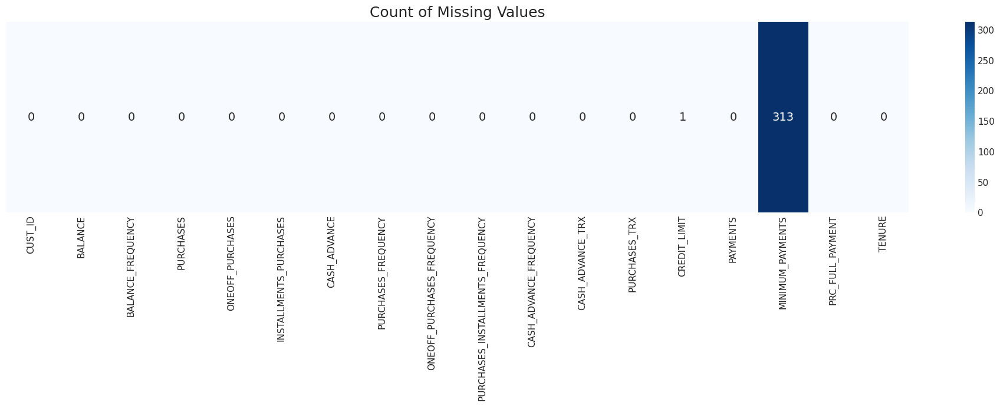

In [353]:
plt.figure(figsize=(22,4))
sns.heatmap((df.isna().sum()).to_frame(name='').T,cmap='Blues', annot=True,
             fmt='0.0f').set_title('Count of Missing Values', fontsize=18)
plt.show()

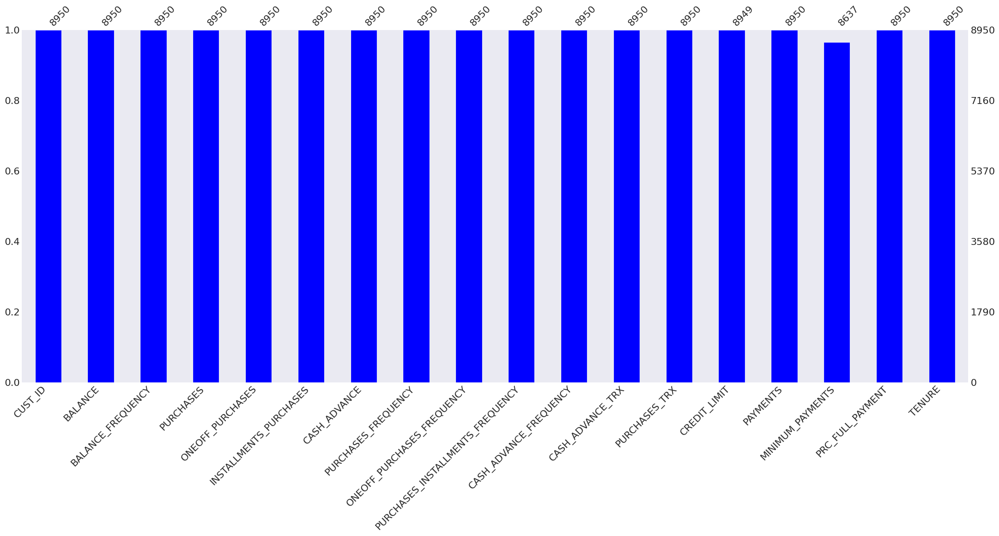

In [354]:

msno.bar(df, color='blue')
plt.show()

In [355]:
df = df.drop(['CUST_ID'], axis=1)

In [356]:
df[df['CREDIT_LIMIT'].isnull()]

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
5203,18.400472,0.166667,0.0,0.0,0.0,186.853063,0.0,0.0,0.0,0.166667,1,0,NaN,9.040017,14.418723,0.0,6


In [357]:
# dropping the missing value
df = df.drop(5203)
# resetting the index
df = df.reset_index(drop=True)

In [358]:
df[['PAYMENTS', 'MINIMUM_PAYMENTS']][df['MINIMUM_PAYMENTS'].isna()]

,PAYMENTS,MINIMUM_PAYMENTS
3,0.000000,NaN
45,0.000000,NaN
47,0.000000,NaN
54,417.016763,NaN
55,0.000000,NaN
...,...,...
8918,0.000000,NaN
8928,0.000000,NaN
8934,0.000000,NaN
8943,0.000000,NaN


In [359]:
print('Shape:', df[['PAYMENTS', 'MINIMUM_PAYMENTS']][(df['MINIMUM_PAYMENTS'].notna()) & (df['PAYMENTS'] > df['MINIMUM_PAYMENTS'])].shape)
df[['PAYMENTS', 'MINIMUM_PAYMENTS']][(df['MINIMUM_PAYMENTS'].notna()) & (df['PAYMENTS'] > df['MINIMUM_PAYMENTS'])].head()

Shape: (6272, 2)


,PAYMENTS,MINIMUM_PAYMENTS
0,201.802084,139.509787
1,4103.032597,1072.340217
4,678.334763,244.791237
6,6354.314328,198.065894
7,679.065082,532.033990


In [360]:
print('Shape:', df[['PAYMENTS', 'MINIMUM_PAYMENTS']][(df['MINIMUM_PAYMENTS'].notna()) & (df['PAYMENTS'] < df['MINIMUM_PAYMENTS'])].shape)
df[['PAYMENTS', 'MINIMUM_PAYMENTS']][(df['MINIMUM_PAYMENTS'].notna()) & (df['PAYMENTS'] < df['MINIMUM_PAYMENTS'])].head()

Shape: (2364, 2)


,PAYMENTS,MINIMUM_PAYMENTS
2,622.066742,627.284787
5,1400.057770,2407.246035
10,1083.301007,2172.697765
14,805.647974,989.962866
15,1993.439277,2109.906490


In [361]:
mp = df['MINIMUM_PAYMENTS'].copy()
payments_mean = np.mean(df['PAYMENTS'])
i = 0
for payments, mps in zip(df['PAYMENTS'], df['MINIMUM_PAYMENTS'].isna()):
    if (payments == 0) and (mps == True):
        mp[i] = 0
    elif (0 < payments < payments_mean) and (mps == True):
        mp[i] = payments
    elif mps == True:
        mp[i] = payments_mean
    i += 1
df['MINIMUM_PAYMENTS'] = mp.copy()

In [362]:
df.isnull()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
8945,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
8946,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
8947,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [363]:
df.describe()[1:].T.style.background_gradient(cmap='Blues', axis=1)

,mean,std,min,25%,50%,75%,max
BALANCE,1564.647593,2081.584016,0.000000,128.365782,873.680279,2054.372848,19043.138560
BALANCE_FREQUENCY,0.877350,0.236798,0.000000,0.888889,1.000000,1.000000,1.000000
PURCHASES,1003.316936,2136.727848,0.000000,39.800000,361.490000,1110.170000,49039.570000
ONEOFF_PURCHASES,592.503572,1659.968851,0.000000,0.000000,38.000000,577.830000,40761.250000
INSTALLMENTS_PURCHASES,411.113579,904.378205,0.000000,0.000000,89.000000,468.650000,22500.000000
CASH_ADVANCE,978.959616,2097.264344,0.000000,0.000000,0.000000,1113.868654,47137.211760
PURCHASES_FREQUENCY,0.490405,0.401360,0.000000,0.083333,0.500000,0.916667,1.000000
ONEOFF_PURCHASES_FREQUENCY,0.202480,0.298345,0.000000,0.000000,0.083333,0.300000,1.000000
PURCHASES_INSTALLMENTS_FREQUENCY,0.364478,0.397451,0.000000,0.000000,0.166667,0.750000,1.000000
CASH_ADVANCE_FREQUENCY,0.135141,0.200132,0.000000,0.000000,0.000000,0.222222,1.500000


In [364]:
df.apply(lambda x: len(x.unique()))

,0
BALANCE,8870
BALANCE_FREQUENCY,43
PURCHASES,6203
ONEOFF_PURCHASES,4014
INSTALLMENTS_PURCHASES,4452
CASH_ADVANCE,4322
PURCHASES_FREQUENCY,47
ONEOFF_PURCHASES_FREQUENCY,47
PURCHASES_INSTALLMENTS_FREQUENCY,47
CASH_ADVANCE_FREQUENCY,54


In [365]:
unique = df.nunique().sort_values()
unique_values = df.apply(lambda x: x.unique())
pd.DataFrame({'Number of Unique Values': unique, 'Unique Values': unique_values})

,Number of Unique Values,Unique Values
BALANCE,8870,"[40.900749, 3202.467416, 2495.148862, 1666.670..."
BALANCE_FREQUENCY,43,"[0.818182, 0.909091, 1.0, 0.636364, 0.545455, ..."
CASH_ADVANCE,4322,"[0.0, 6442.945483, 205.788017, 346.81139, 2301..."
CASH_ADVANCE_FREQUENCY,54,"[0.0, 0.25, 0.083333, 0.166667, 0.333333, 0.36..."
CASH_ADVANCE_TRX,65,"[0, 4, 1, 3, 6, 13, 5, 16, 10, 2, 11, 7, 12, 3..."
CREDIT_LIMIT,205,"[1000.0, 7000.0, 7500.0, 1200.0, 1800.0, 13500..."
INSTALLMENTS_PURCHASES,4452,"[95.4, 0.0, 1333.28, 688.38, 436.2, 200.0, 920..."
MINIMUM_PAYMENTS,8702,"[139.509787, 1072.340217, 627.284787, 0.0, 244..."
ONEOFF_PURCHASES,4014,"[0.0, 773.17, 1499.0, 16.0, 6402.63, 661.49, 1..."
ONEOFF_PURCHASES_FREQUENCY,47,"[0.0, 1.0, 0.083333, 0.166667, 0.25, 0.916667,..."


## Visualization

In [366]:
df['MonthlyCashAdvance']=df['CASH_ADVANCE']/df['TENURE']

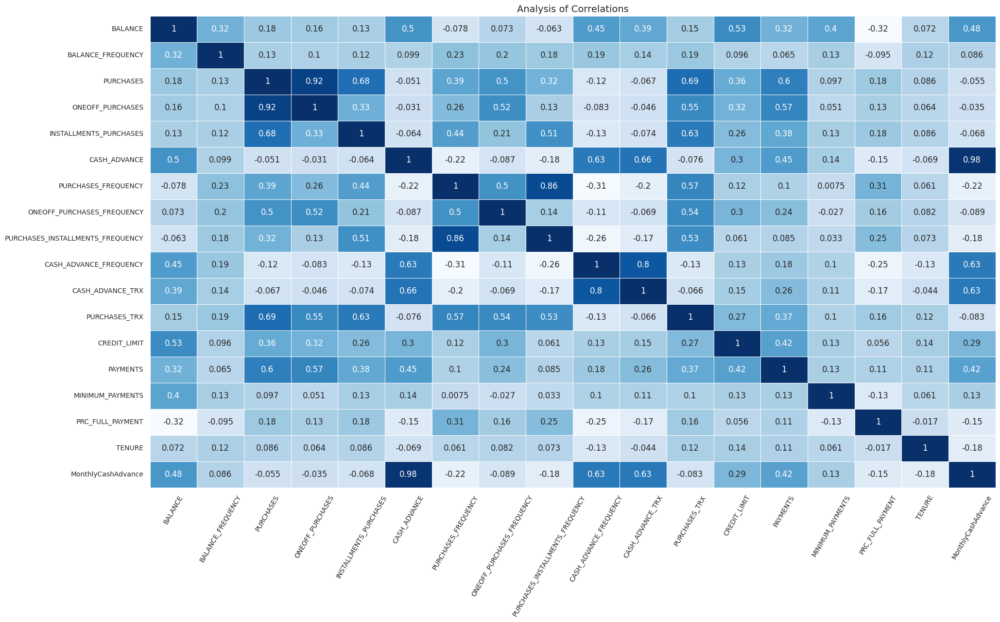

In [367]:
def correlated_map(dataframe, plot=False):
    corr = dataframe.corr()
    if plot:
        sns.set(rc={'figure.figsize': (20, 12)})
        sns.heatmap(corr, cmap="Blues", annot=True, linewidths=.6 , cbar = False)
        plt.xticks(rotation=60, size=10)
        plt.yticks(size=10)
        plt.title('Analysis of Correlations', size=14)
        plt.show()
correlated_map(df, plot=True)

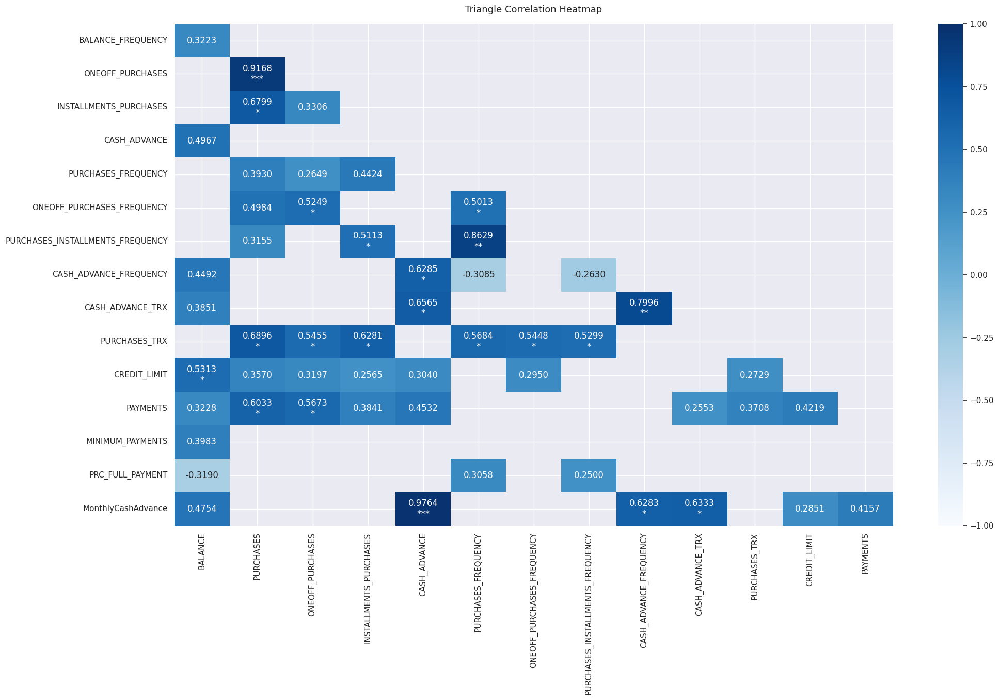

In [368]:
corr = df.corr()
f, ax = plt.subplots(figsize=(20, 12))
mask = np.triu(np.ones_like(corr, dtype=bool))
cut_off = 0.25
extreme_1 = 0.5
extreme_2 = 0.75
extreme_3 = 0.9
mask |= np.abs(corr) < cut_off
corr = corr[~mask]
remove_empty_rows_and_cols = True
if remove_empty_rows_and_cols:
    wanted_cols = np.flatnonzero(np.count_nonzero(~mask, axis=1))
    wanted_rows = np.flatnonzero(np.count_nonzero(~mask, axis=0))
    corr = corr.iloc[wanted_cols, wanted_rows]

annot = [[f"{val:.4f}"
          + ('' if abs(val) < extreme_1 else '\n*')
          + ('' if abs(val) < extreme_2 else '*')
          + ('' if abs(val) < extreme_3 else '*')
          for val in row] for row in corr.to_numpy()]
heatmap = sns.heatmap(corr, vmin=-1, vmax=1, annot=annot, fmt='', cmap='Blues')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize': 13}, pad=16)
plt.show()

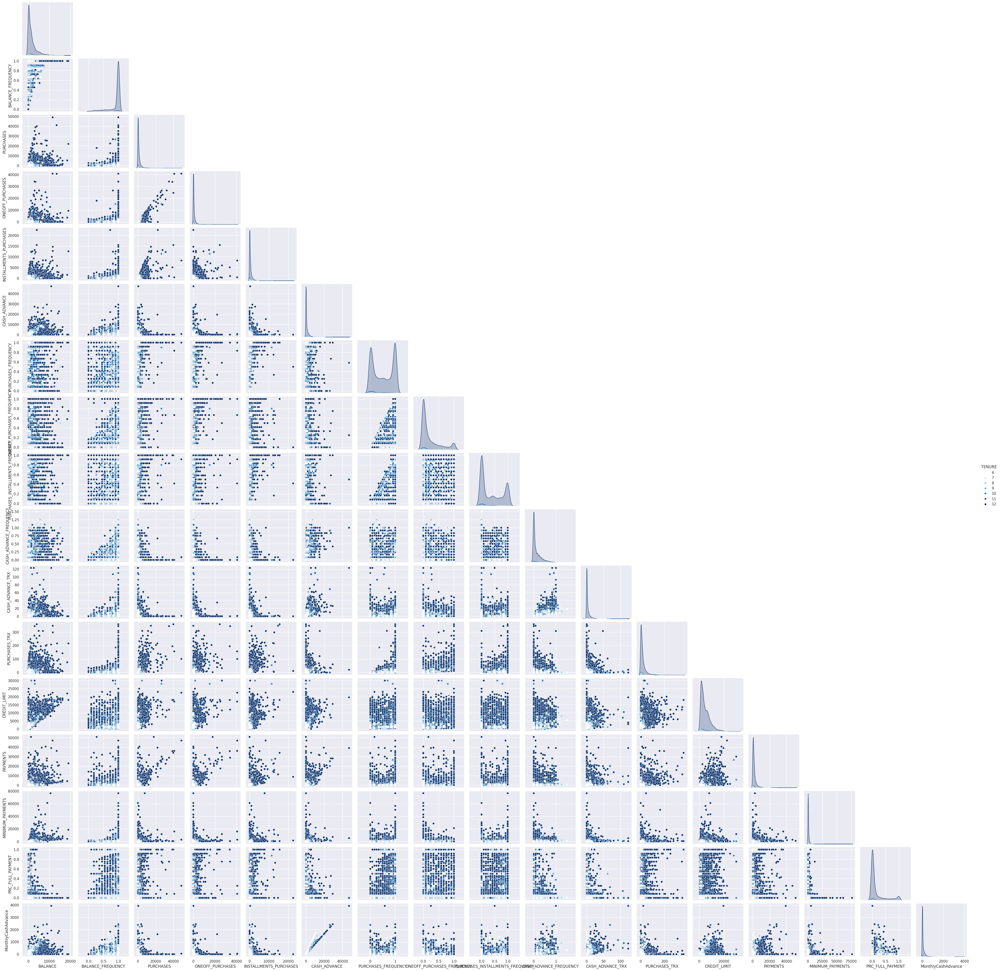

In [369]:
sns.pairplot(data=df, diag_kind='kde',hue="TENURE",palette='Blues',corner=True)
plt.show()

In [370]:
df['TENURE'].value_counts()

,count
TENURE,
12,7584
11,365
10,236
6,203
8,196
7,190
9,175


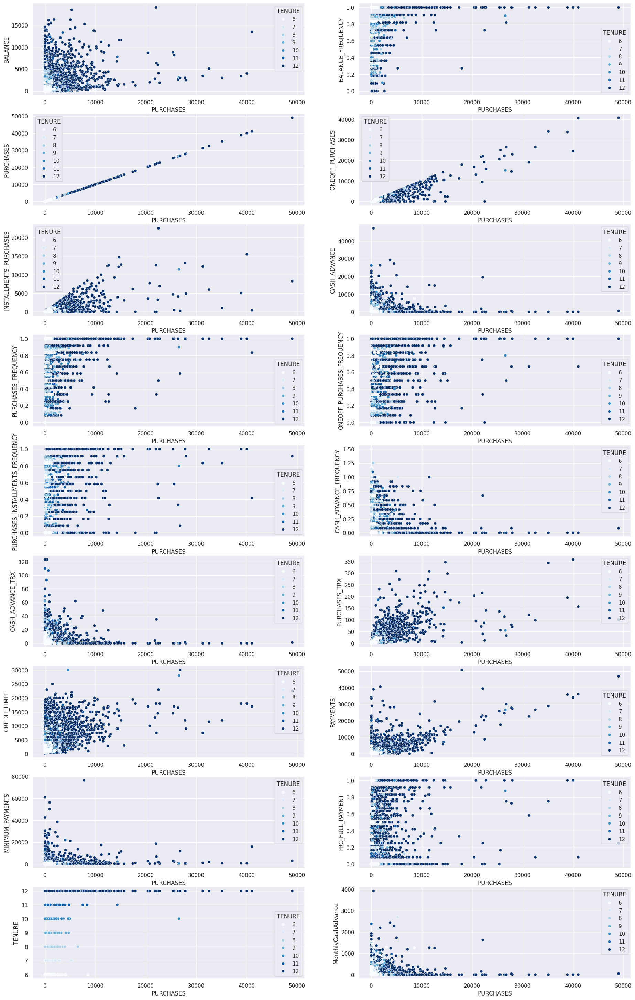

In [371]:
ff = ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE', 'MonthlyCashAdvance']
fig=plt.figure(figsize=(20,35))
for i,col in enumerate(ff):
    ax=fig.add_subplot(9,2,i+1)
    sns.scatterplot(x='PURCHASES',y=col,hue='TENURE',data=df,palette="Blues")

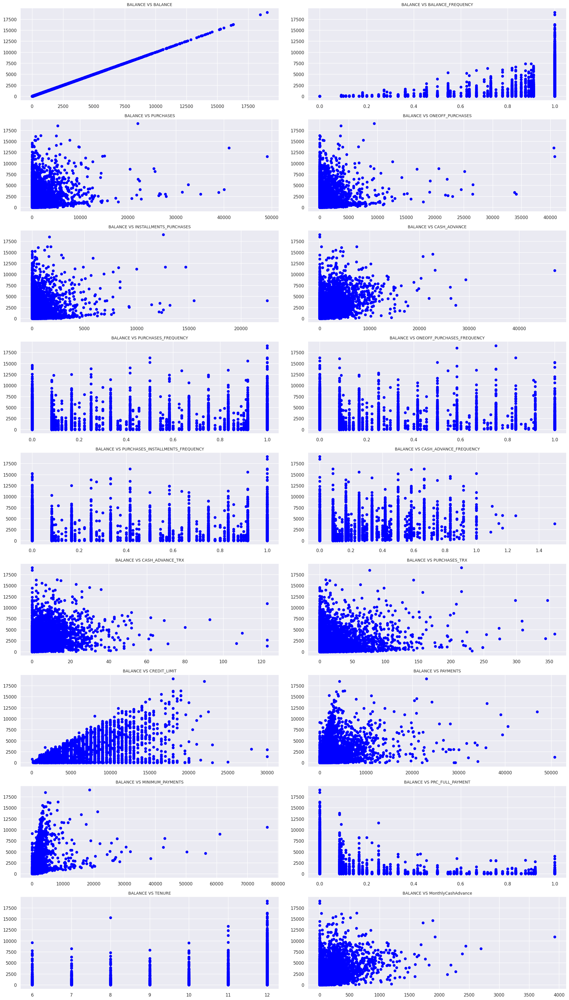

In [372]:

plt.figure(1 , figsize = (20 , 35))
n = 0
for x in ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY' ,
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE', 'MonthlyCashAdvance']:
    n += 1
    plt.subplot(9 , 2 , n)
    plt.subplots_adjust(hspace =0.5 , wspace = 0.5)
    plt.scatter(df[x], df['BALANCE'], color = 'blue')
    plt.title('BALANCE VS {}'.format(x), fontsize = 10)
plt.tight_layout()
plt.show()


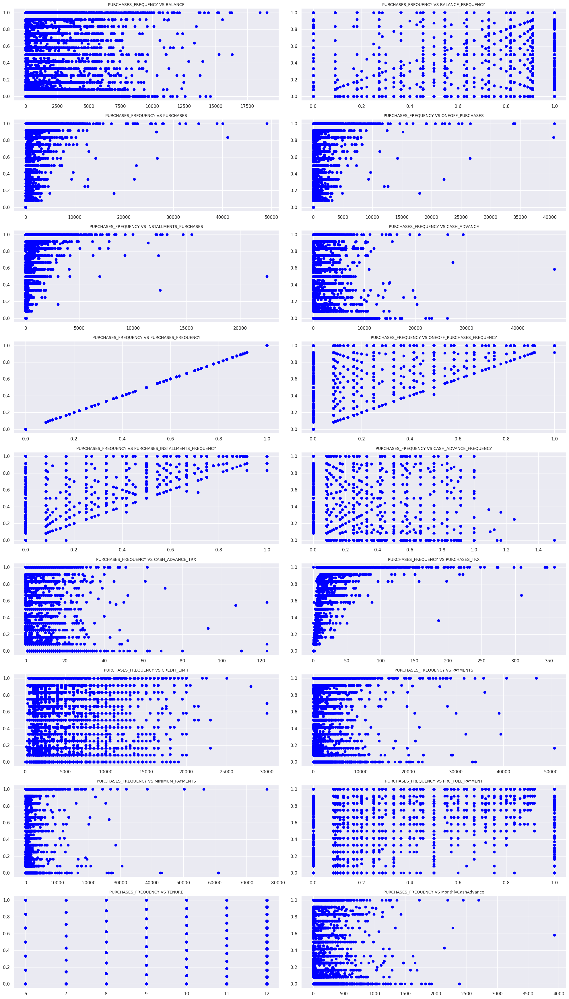

In [373]:

plt.figure(1 , figsize = (20 , 35))
n = 0
for x in ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY' ,
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE', 'MonthlyCashAdvance']:
    n += 1
    plt.subplot(9 , 2 , n)
    plt.subplots_adjust(hspace =0.5 , wspace = 0.5)
    plt.scatter(df[x], df['PURCHASES_FREQUENCY'], color = 'blue')
    plt.title('PURCHASES_FREQUENCY VS {}'.format(x), fontsize = 10)
plt.tight_layout()
plt.show()


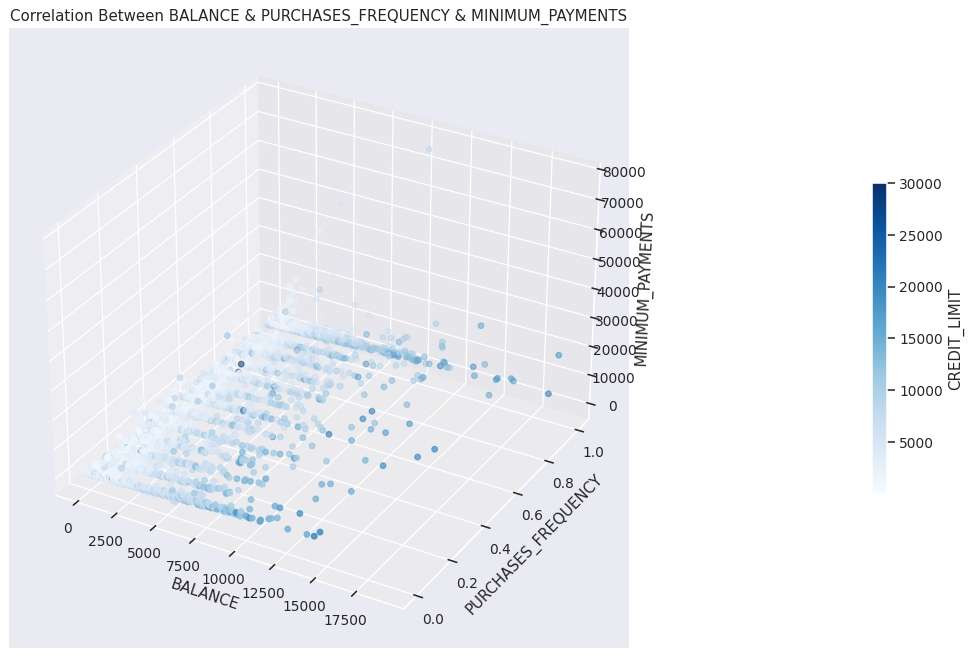

In [374]:

fig = plt.figure(figsize=(10, 8.5),dpi=90)
ax = fig.add_subplot(111,projection='3d')
p1 = ax.scatter(df['BALANCE'], df['PURCHASES_FREQUENCY'], df['MINIMUM_PAYMENTS'],c=df['CREDIT_LIMIT'],cmap='Blues')
fig.colorbar(p1, shrink=0.5,label='CREDIT_LIMIT',anchor=(2,0.5))
ax.set_xlabel("BALANCE")
ax.set_ylabel("PURCHASES_FREQUENCY")
ax.set_zlabel("MINIMUM_PAYMENTS")
ax.set_title("Correlation Between BALANCE & PURCHASES_FREQUENCY & MINIMUM_PAYMENTS",fontdict={'fontsize': 12})
fig.show()


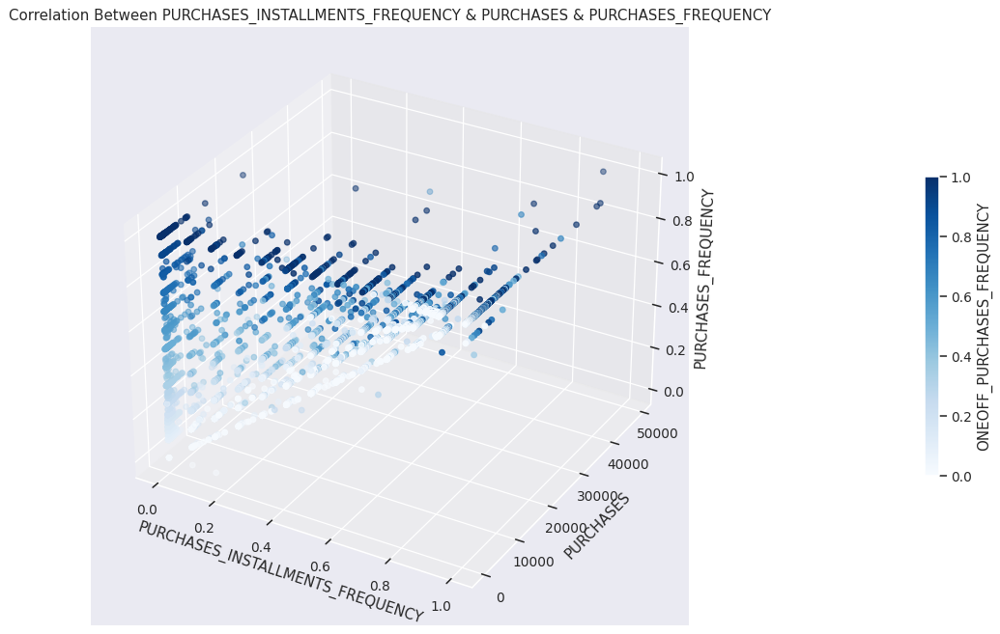

In [375]:

fig = plt.figure(figsize=(10, 8.5),dpi=90)
ax = fig.add_subplot(111,projection='3d')
p1 = ax.scatter(df['PURCHASES_INSTALLMENTS_FREQUENCY'], df['PURCHASES'], df['PURCHASES_FREQUENCY'],c=df['ONEOFF_PURCHASES_FREQUENCY'],cmap='Blues')
fig.colorbar(p1, shrink=0.5,label='ONEOFF_PURCHASES_FREQUENCY',anchor=(2,0.5))
ax.set_xlabel("PURCHASES_INSTALLMENTS_FREQUENCY")
ax.set_ylabel("PURCHASES")
ax.set_zlabel("PURCHASES_FREQUENCY")
ax.set_title("Correlation Between PURCHASES_INSTALLMENTS_FREQUENCY & PURCHASES & PURCHASES_FREQUENCY",fontdict={'fontsize': 12})
fig.show()


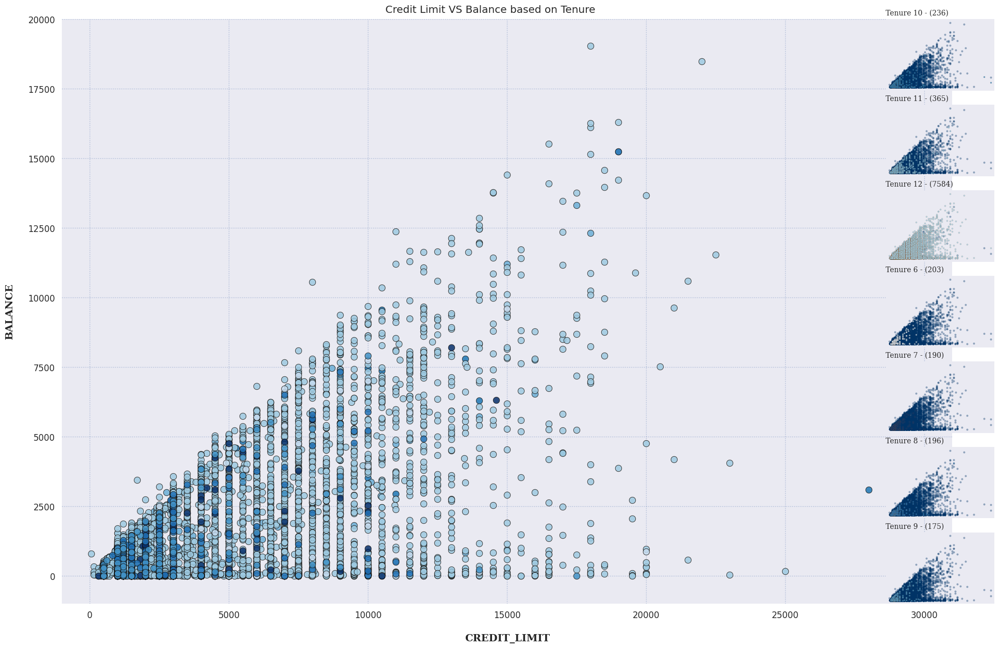

In [376]:

scatter_style=dict(linewidth=0.65, edgecolor='#100C07', alpha=0.85)
sub_scatter_style_color=dict(s=5, alpha=0.65, linewidth=0.15, zorder=10, edgecolor='#8b5e34')
sub_scatter_style_grey=dict(s=5, alpha=0.3, linewidth=0.7, zorder=5, color='#003366')
grid_style=dict(alpha=0.3, color='#0b3d91', linestyle='dotted', zorder=1)
xy_label=dict(fontweight='bold', fontsize=14, fontfamily='serif')
suptitle=dict(fontsize=22, fontweight='heavy', fontfamily='serif')
title=dict(fontsize=16, fontfamily='serif')
color_pallete = ['#1f77b4', '#6baed6', '#9ecae1', '#c6dbef', '#08306b', '#2171b5', '#4292c6']
sub_axes=[None] * 7
plot = df[['CREDIT_LIMIT', 'BALANCE', 'TENURE']]
plot['TENURE'] = plot['TENURE'].astype(str)
tenure = sorted(plot['TENURE'].unique())
fig = plt.figure(figsize=(22, 14))
gs = fig.add_gridspec(7, 7)
ax = fig.add_subplot(gs[:, :7])
ax.set_aspect(1)
for x in range(len(tenure)):
    plot_x = plot[plot['TENURE']==tenure[x]]
    ax.scatter(plot_x['CREDIT_LIMIT'], plot_x['BALANCE'], s=80, color=color_pallete[x], **scatter_style)
    ax.set_xlabel('\nCREDIT_LIMIT', **xy_label)
    ax.set_ylabel('BALANCE\n', **xy_label)
    ax.grid(axis='y', which='major', **grid_style)
    ax.grid(axis='x', which='major', **grid_style)
    for spine in ax.spines.values():
        spine.set_color('None')
    for spine in ['bottom', 'left']:
        ax.spines[spine].set_visible(True)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
for idx, tnr in enumerate(tenure):
    sub_axes[idx] = fig.add_subplot(gs[idx, 6], aspect=1)
    sub_axes[idx].scatter(plot[plot['TENURE']!=tnr]['CREDIT_LIMIT'], plot[plot['TENURE']!=tnr]['BALANCE'], label=tnr, **sub_scatter_style_grey)
    sub_axes[idx].scatter(plot[plot['TENURE']==tnr]['CREDIT_LIMIT'], plot[plot['TENURE']==tnr]['BALANCE'], color=color_pallete[idx], label=tnr, **sub_scatter_style_color)
    cnt = (plot['TENURE']==tnr).sum()
    sub_axes[idx].set_title(f'Tenure {tnr} - ({cnt})', loc='left', fontsize=10, fontfamily='serif')
    sub_axes[idx].set_xticks([])
    sub_axes[idx].set_yticks([])
    for spine in sub_axes[idx].spines.values():
        spine.set_color('None')
for axes in [ax] + sub_axes:
    axes.set_xlim(-1000, 31000)
    axes.set_ylim(-1000, 20000)
plt.suptitle('Credit Limit VS Balance based on Tenure',y=0.90)
plt.show();


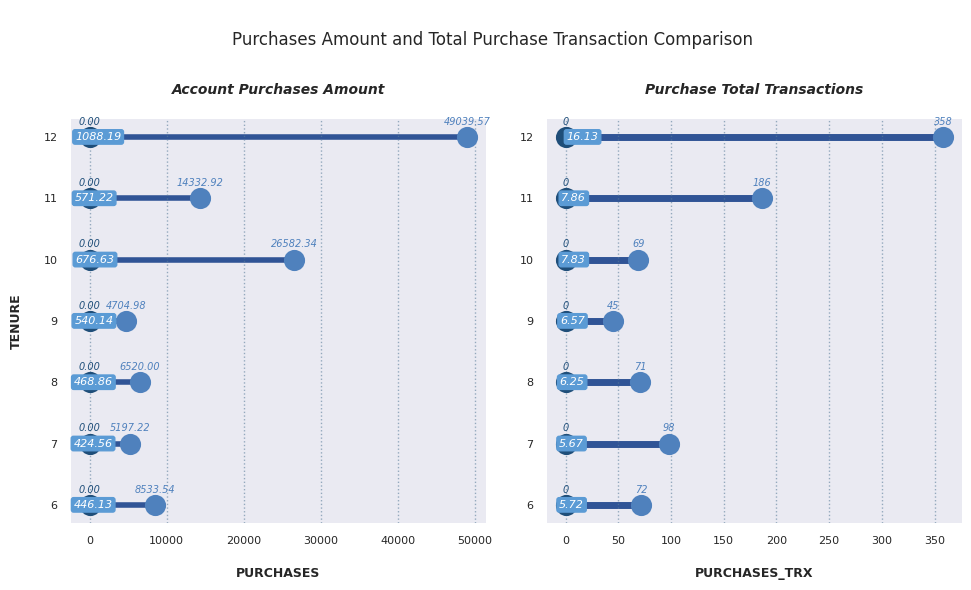

In [377]:

title = dict(fontsize=10, style='italic', weight='bold', ha='center')
grid_style = dict(alpha=0.6, color='#5A7D9A', linestyle='dotted', zorder=1)
sct_style = dict(s=175, linewidth=2)
xy_label = dict(fontweight='bold', fontsize=9)
ann_style = dict(xytext=(0, 0), textcoords='offset points', va='center', ha='center', style='italic')
tenure = sorted(df['TENURE'].unique())

# Blue color palette
color_pallete = ['#1f4e79', '#4f81bd', '#305496', '#5b9bd5', '#c6d9f1', '#2e75b6', '#a5b3c5']

plot_1 = df[['PURCHASES', 'TENURE']]
plot_1 = plot_1.groupby('TENURE').agg(MIN=('PURCHASES', 'min'), AVG=('PURCHASES', 'mean'), MAX=('PURCHASES', 'max')).reset_index()
plot_2 = df[['PURCHASES_TRX', 'TENURE']]
plot_2 = plot_2.groupby('TENURE').agg(MIN=('PURCHASES_TRX', 'min'), AVG=('PURCHASES_TRX', 'mean'), MAX=('PURCHASES_TRX', 'max')).reset_index()

fig = plt.figure(figsize=(10, 6))
plt.suptitle('\nPurchases Amount and Total Purchase Transaction Comparison', fontsize=12)

# Left plot for PURCHASES
plt.subplot(1, 2, 1)
plt.tight_layout(rect=[0, 0, 1, 1.01])
axs_left = plt.gca()

min_sct = plt.scatter(x=plot_1['MIN'], y=plot_1['TENURE'], c='#1f4e79', **sct_style)
max_sct = plt.scatter(x=plot_1['MAX'], y=plot_1['TENURE'], c='#4f81bd', **sct_style)
for i in range(len(tenure)):
    plot_1_x = plot_1[plot_1['TENURE'] == tenure[i]]
    plt.hlines(y=plot_1_x['TENURE'], xmin=plot_1_x['MIN'], xmax=plot_1_x['MAX'], linewidth=4, color='#305496', zorder=0)
    plt.annotate('{0:.2f}'.format(plot_1_x['MIN'].values[0]), xy=(plot_1_x['MIN'].values[0], plot_1_x['TENURE'].values[0] + 0.25), color='#1f4e79', fontsize=7, **ann_style)
    plt.annotate('{0:.2f}'.format(plot_1_x['AVG'].values[0]), xy=(plot_1_x['AVG'].values[0], plot_1_x['TENURE'].values[0]), color='w', fontsize=8, bbox=dict(boxstyle='round', pad=0.2, color='#5b9bd5'), **ann_style)
    plt.annotate('{0:.2f}'.format(plot_1_x['MAX'].values[0]), xy=(plot_1_x['MAX'].values[0], plot_1_x['TENURE'].values[0] + 0.25), color='#4f81bd', fontsize=7, **ann_style)

for spine in axs_left.spines.values():
    spine.set_color('None')

plt.xlabel('\nPURCHASES', **xy_label)
plt.ylabel('TENURE\n', **xy_label)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.grid(axis='y', alpha=0)
plt.grid(axis='x', which='major', **grid_style)
plt.title('\nAccount Purchases Amount\n', **title)

# Right plot for PURCHASES_TRX
plt.subplot(1, 2, 2)
plt.tight_layout(rect=[0, 0, 1, 1.01])
axs_right = plt.gca()

min_sctt = plt.scatter(x=plot_2['MIN'], y=plot_2['TENURE'], c='#1f4e79', **sct_style)
max_sctt = plt.scatter(x=plot_2['MAX'], y=plot_2['TENURE'], c='#4f81bd', **sct_style)
for i in range(len(tenure)):
    plot_2_x = plot_2[plot_2['TENURE'] == tenure[i]]
    plt.hlines(y=plot_2_x['TENURE'], xmin=plot_2_x['MIN'], xmax=plot_2_x['MAX'], linewidth=5, color='#305496', zorder=0)
    plt.annotate('{:.0f}'.format(plot_2_x['MIN'].values[0]), xy=(plot_2_x['MIN'].values[0], plot_2_x['TENURE'].values[0] + 0.25), color='#1f4e79', fontsize=7, **ann_style)
    plt.annotate('{0:.2f}'.format(plot_2_x['AVG'].values[0]), xy=(plot_2_x['AVG'].values[0], plot_2_x['TENURE'].values[0]), color='w', fontsize=8, bbox=dict(boxstyle='round', pad=0.2, color='#5b9bd5'), **ann_style)
    plt.annotate('{:.0f}'.format(plot_2_x['MAX'].values[0]), xy=(plot_2_x['MAX'].values[0], plot_2_x['TENURE'].values[0] + 0.25), color='#4f81bd', fontsize=7, **ann_style)

for spine in axs_right.spines.values():
    spine.set_color('None')

plt.xlabel('\nPURCHASES_TRX', **xy_label)
plt.ylabel('')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.grid(axis='y', alpha=0)
plt.grid(axis='x', which='major', **grid_style)
plt.title('\nPurchase Total Transactions\n', **title)

plt.show()



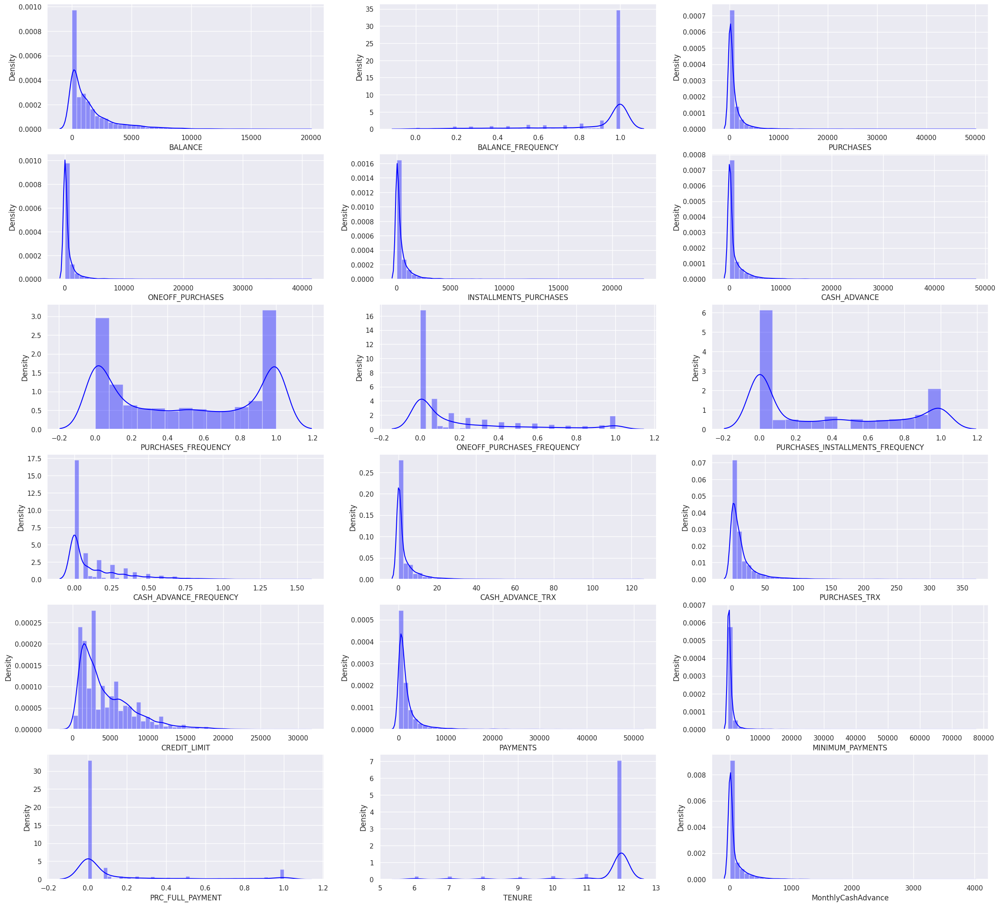

In [378]:

df_columns = ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE', 'MonthlyCashAdvance']
fig=plt.figure(figsize=(25,25))
for i,col in enumerate(df_columns):
    ax=fig.add_subplot(6,3,i+1)
    ax1=sns.distplot(df[df.columns[i]] ,kde=True,color='blue')


In [379]:
# measure of skewness
df.skew(axis = 0, skipna = True)

,0
BALANCE,2.393270
BALANCE_FREQUENCY,-2.024193
PURCHASES,8.143969
ONEOFF_PURCHASES,10.044622
INSTALLMENTS_PURCHASES,7.298823
CASH_ADVANCE,5.166323
PURCHASES_FREQUENCY,0.059970
ONEOFF_PURCHASES_FREQUENCY,1.535453
PURCHASES_INSTALLMENTS_FREQUENCY,0.509023
CASH_ADVANCE_FREQUENCY,1.828644


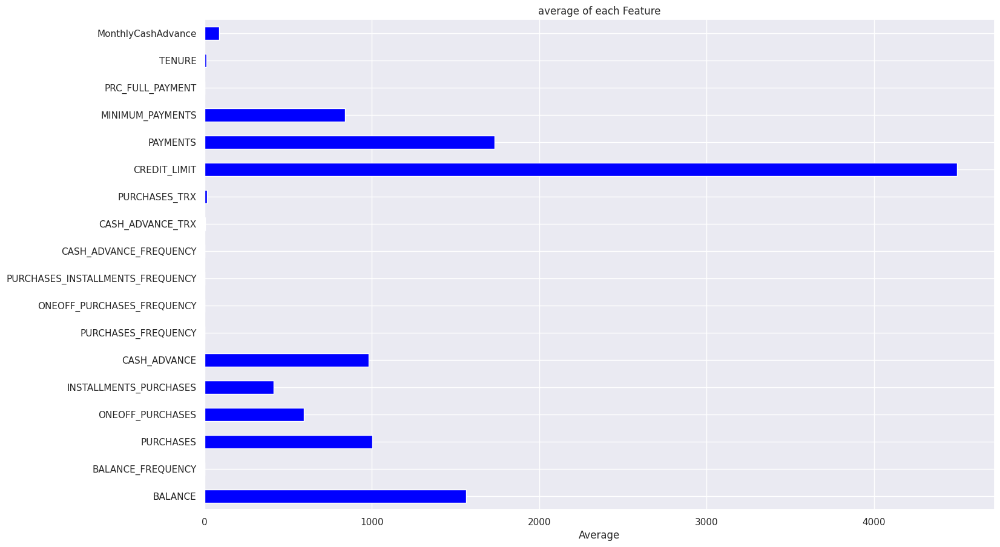

In [380]:
columns1 = ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE', 'MonthlyCashAdvance']
df_mean = df[columns1].mean()
df_mean.plot(kind='barh', stacked=True, figsize=(15, 10),color='blue')
plt.xlabel('Average')
plt.title('average of each Feature')
plt.show()

In [381]:
feature_list = ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
             'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
             'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
             'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
             'CREDIT_LIMIT', 'PAYMENTS','MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
              "CASH_ADVANCE_TRX", "PURCHASES_TRX", "TENURE", "MonthlyCashAdvance"]
def StDev_method (df,n,features):
    outliers = []

    for column in features:
        data_mean = df[column].mean()
        data_std = df[column].std()
        cut_off = data_std * 3
        outlier_list_column = df[(df[column] < data_mean - cut_off) | (df[column] > data_mean + cut_off)].index
        outliers.extend(outlier_list_column)
    outliers = Counter(outliers)
    OUT= list( k for k, v in outliers.items() if v > n )
    df1 = df[df[column] > data_mean + cut_off]
    df2 = df[df[column] < data_mean - cut_off]
    print('Total number of outliers is:', df1.shape[0]+ df2.shape[0])

    return OUT
Outliers_StDev = StDev_method(df,1,feature_list)
df_out2 = df.drop(Outliers_StDev, axis = 0).reset_index(drop=True)

Total number of outliers is: 181


In [382]:
cor=df.corr()[1:].T.style.background_gradient(cmap='Blues', axis=1)
cor

,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,MonthlyCashAdvance
BALANCE,0.322335,0.181230,0.164326,0.126437,0.496679,-0.078054,0.073114,-0.063267,0.449246,0.385139,0.154297,0.531283,0.322769,0.398321,-0.319018,0.072421,0.475423
BALANCE_FREQUENCY,1.000000,0.133586,0.104257,0.124204,0.099312,0.229440,0.202295,0.175869,0.192022,0.141516,0.189527,0.095843,0.064842,0.134656,-0.095308,0.118566,0.085963
PURCHASES,0.133586,1.000000,0.916844,0.679889,-0.051495,0.392991,0.498413,0.315537,-0.120137,-0.067194,0.689552,0.356963,0.603252,0.096532,0.180356,0.086155,-0.055489
ONEOFF_PURCHASES,0.104257,0.916844,1.000000,0.330610,-0.031341,0.264913,0.524881,0.127699,-0.082622,-0.046226,0.545514,0.319724,0.567283,0.050812,0.132745,0.064047,-0.034557
INSTALLMENTS_PURCHASES,0.124204,0.679889,0.330610,1.000000,-0.064264,0.442398,0.214016,0.511334,-0.132312,-0.074017,0.628097,0.256499,0.384066,0.134754,0.182548,0.086016,-0.067799
CASH_ADVANCE,0.099312,-0.051495,-0.031341,-0.064264,1.000000,-0.215579,-0.086786,-0.177118,0.628535,0.656493,-0.075877,0.303985,0.453226,0.140672,-0.152961,-0.068552,0.976364
PURCHASES_FREQUENCY,0.229440,0.392991,0.264913,0.442398,-0.215579,1.000000,0.501305,0.862921,-0.308483,-0.203541,0.568408,0.119788,0.103393,0.007541,0.305761,0.061006,-0.215846
ONEOFF_PURCHASES_FREQUENCY,0.202295,0.498413,0.524881,0.214016,-0.086786,0.501305,1.000000,0.142270,-0.111707,-0.069116,0.544849,0.295038,0.243503,-0.026732,0.157497,0.082234,-0.089059
PURCHASES_INSTALLMENTS_FREQUENCY,0.175869,0.315537,0.127699,0.511334,-0.177118,0.862921,0.142270,1.000000,-0.262955,-0.169250,0.529949,0.060755,0.085496,0.033343,0.250049,0.072926,-0.179373
CASH_ADVANCE_FREQUENCY,0.192022,-0.120137,-0.082622,-0.132312,0.628535,-0.308483,-0.111707,-0.262955,1.000000,0.799573,-0.131161,0.132616,0.183206,0.100963,-0.249768,-0.133427,0.628321


# Clustering

In [383]:
scaler = StandardScaler().fit(df) # standardize
dftrans = scaler.transform(df)
df1 = pd.DataFrame(dftrans, columns = df.columns)
df1

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,MonthlyCashAdvance
0,-0.732054,-0.249881,-0.424934,-0.356957,-0.349114,-0.466805,-0.806649,-0.678716,-0.707409,-0.675294,-0.476083,-0.511381,-0.960380,-0.529026,-0.299303,-0.525588,0.360541,-0.460737
1,0.786858,0.134049,-0.469584,-0.356957,-0.454607,2.605438,-1.221928,-0.678716,-0.917090,0.573949,0.110032,-0.591841,0.688601,0.818546,0.100137,0.234159,0.360541,2.319245
2,0.447041,0.517980,-0.107716,0.108843,-0.454607,-0.466805,1.269742,2.673295,-0.917090,-0.675294,-0.476083,-0.109082,0.826016,-0.383857,-0.090437,-0.525588,0.360541,-0.460737
3,0.049015,-1.017743,0.231995,0.546123,-0.454607,-0.368678,-1.014290,-0.399383,-0.917090,-0.258882,-0.329554,-0.551611,0.826016,-0.598733,-0.359042,-0.525588,0.360541,-0.371944
4,-0.358849,0.517980,-0.462095,-0.347317,-0.454607,-0.466805,-1.014290,-0.399383,-0.917090,-0.675294,-0.476083,-0.551611,-0.905414,-0.364421,-0.254222,-0.525588,0.360541,-0.460737
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,-0.738015,0.517980,-0.333331,-0.356957,-0.132688,-0.466805,1.269742,-0.678716,1.179720,-0.675294,-0.476083,-0.350461,-0.960380,-0.486266,-0.338109,1.183844,-4.126919,-0.460737
8945,-0.742488,0.517980,-0.329174,-0.356957,-0.122869,-0.466805,1.269742,-0.678716,1.179720,-0.675294,-0.476083,-0.350461,-0.960380,-0.503445,-0.240917,-0.525588,-4.126919,-0.460737
8946,-0.740463,-0.185895,-0.402000,-0.356957,-0.294930,-0.466805,0.854463,-0.678716,0.760359,-0.675294,-0.476083,-0.390691,-0.960380,-0.570660,-0.323750,0.329128,-4.126919,-0.460737
8947,-0.745239,-0.185895,-0.469584,-0.356957,-0.454607,-0.449373,-1.221928,-0.678716,-0.917090,0.157536,-0.183026,-0.591841,-1.097795,-0.580581,-0.335167,0.329128,-4.126919,-0.429188


# K-means

In [384]:
kmeans_set = {"init":"random", "n_init":10, "max_iter":300, "random_state":42}
inertias = [] # inertia for k cluster
for k in range(1,11):
    kmeans = KMeans(n_clusters=k, **kmeans_set)
    kmeans.fit(df1)
    inertias.append(kmeans.inertia_)

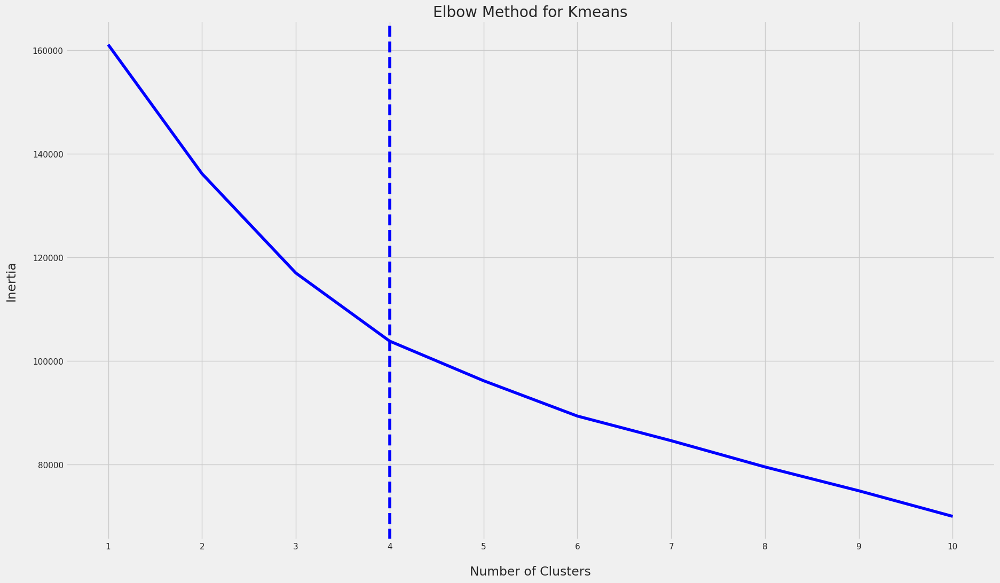

In [385]:
def elbow_optimizer(inertias,i):
    kl = KneeLocator(range(1,11), inertias, curve='convex', direction="decreasing")
    plt.style.use("fivethirtyeight")
    sns.lineplot(x=range(1,11), y=inertias, color='blue')
    plt.xticks(range(1,11))
    plt.xlabel("Number of Clusters", labelpad=20)
    plt.ylabel("Inertia", labelpad=20)
    plt.title(f"Elbow Method for {i}", y=1)
    plt.axvline(x=kl.elbow, color='blue', label='axvline-fullheight', ls='--')
    plt.show()
elbow_optimizer(inertias, 'Kmeans') # elbow_optimizer function for KMeans

In [386]:
silhouette = []
for k in range(2,11):
    kmeans = KMeans(n_clusters=k, **kmeans_set)
    kmeans.fit(df1)
    score = silhouette_score(df1, kmeans.labels_)
    silhouette.append(score)
calinski_harabasz = []
for k in range(2,11):
    kmeans = KMeans(n_clusters=k, **kmeans_set)
    kmeans.fit(df1)
    score = calinski_harabasz_score(df1, kmeans.labels_)
    calinski_harabasz.append(score)

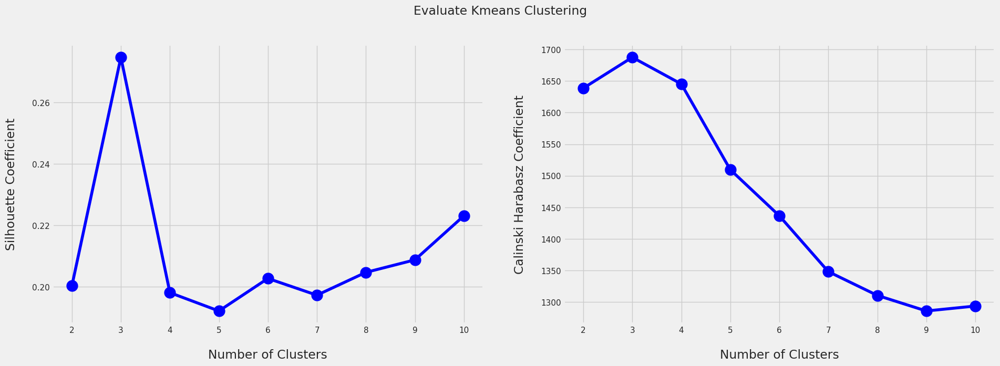

In [387]:
def plot_evaluation(sil, cal, name, x=range(2,11)):
    fig, ax = plt.subplots(1,2,figsize=(20,8), dpi=100)
    ax[0].plot(x, sil, color='blue', marker='o', ms=15, mfc='blue')
    ax[1].plot(x, cal, color='blue', marker='o', ms=15, mfc='blue')
    ax[0].set_xlabel("Number of Clusters", labelpad=20)
    ax[0].set_ylabel("Silhouette Coefficient", labelpad=20)
    ax[1].set_xlabel("Number of Clusters", labelpad=20)
    ax[1].set_ylabel("Calinski Harabasz Coefficient", labelpad=20)
    plt.suptitle(f'Evaluate {name} Clustering',y=0.92)
    plt.tight_layout(pad=3)
    plt.show()
# checking the correctness of the elbow method's result
plot_evaluation(silhouette, calinski_harabasz, 'Kmeans')

In [388]:
best_model = pd.DataFrame({'model':[], 'sil_score':[], 'ch_score':[]})

In [389]:
kmeans = KMeans(n_clusters=3, **kmeans_set).fit(df1)
pred = kmeans.labels_
centroids = kmeans.cluster_centers_
centroids = pd.DataFrame(data=centroids, columns = [df1.columns])
centroids.T

,0,1,2
BALANCE,-0.336319,0.286274,1.220017
BALANCE_FREQUENCY,-0.162215,0.438864,0.311286
PURCHASES,-0.243403,1.449846,-0.262085
ONEOFF_PURCHASES,-0.211552,1.212788,-0.184173
INSTALLMENTS_PURCHASES,-0.186756,1.199605,-0.281421
CASH_ADVANCE,-0.302376,-0.291805,1.602932
PURCHASES_FREQUENCY,-0.100809,1.133909,-0.600074
ONEOFF_PURCHASES_FREQUENCY,-0.258232,1.535576,-0.275656
PURCHASES_INSTALLMENTS_FREQUENCY,-0.076394,0.929430,-0.519377
CASH_ADVANCE_FREQUENCY,-0.291158,-0.385226,1.639521


In [390]:
best_model.loc[len(best_model.index)] = [f"Kmeans",silhouette_score(df1, pred),calinski_harabasz_score(df1, pred)]

In [391]:
actualcentroids = scaler.inverse_transform(centroids)
actualcentroids = pd.DataFrame(data=actualcentroids, columns = [df1.columns])
actualcentroids.T

,0,1,2
BALANCE,864.610517,2160.517279,4104.073495
BALANCE_FREQUENCY,0.838940,0.981267,0.951058
PURCHASES,483.260351,4101.069785,443.344211
ONEOFF_PURCHASES,241.353978,2605.580853,286.799363
INSTALLMENTS_PURCHASES,242.224782,1495.949762,156.616801
CASH_ADVANCE,344.832332,367.001473,4340.544181
PURCHASES_FREQUENCY,0.449947,0.945485,0.249573
ONEOFF_PURCHASES_FREQUENCY,0.125442,0.660586,0.120244
PURCHASES_INSTALLMENTS_FREQUENCY,0.334117,0.733860,0.158063
CASH_ADVANCE_FREQUENCY,0.076874,0.058049,0.463243


In [392]:
df_kmeans = pd.concat([df, pd.DataFrame(pred, columns=['cluster'])], axis = 1) # adding the clusters column to the main dataframe
df_kmeans

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,MonthlyCashAdvance,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,0.000000,0
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,536.912124,2
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,0.000000,0
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,0.000000,0.000000,12,17.149001,0
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,0.000000,0
8945,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,275.861322,0.000000,6,0.000000,0
8946,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,0.000000,0
8947,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,6.093130,0


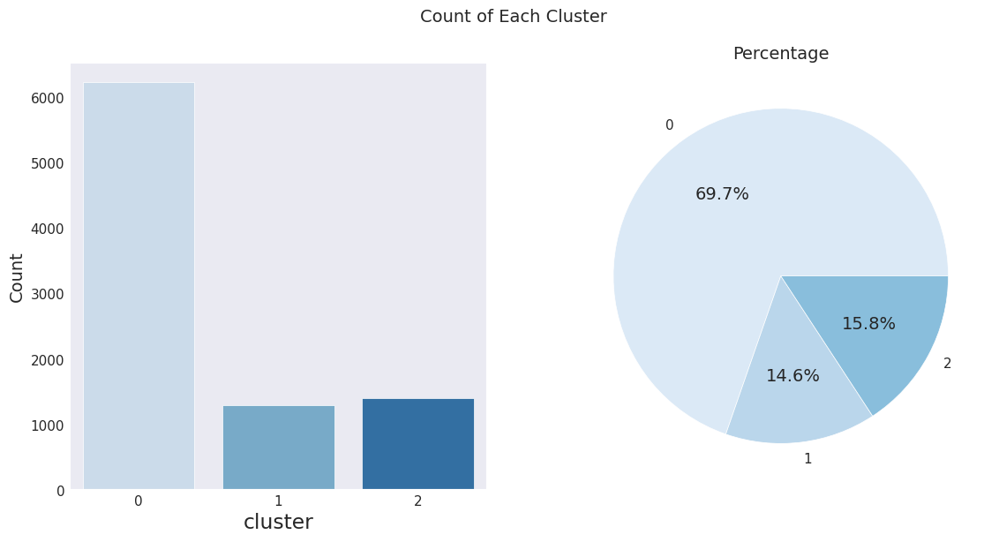

In [393]:
def check_result(data,plot=False):
    if plot:
        sns.set_style("dark")
        fig, ax = plt.subplots(1, 2)
        ax = np.reshape(ax, (1, 2))
        ax[0, 0] = sns.countplot(data=data, x='cluster', palette="Blues", ax=ax[0, 0])
        ax[0, 0].set_ylabel('Count',fontsize=14)
        ax[0, 0].set_xticklabels(ax[0, 0].get_xticklabels(), rotation=0)
        slices = data['cluster'].value_counts().sort_index().values
        activities = [var for var in data['cluster'].value_counts().sort_index().index]
        ax[0, 1] = plt.pie(slices, labels=activities,
                           colors=sns.color_palette('Blues'), autopct='%1.01f%%')
        plt.title("Percentage",fontsize=14)
        fig.set_size_inches(12, 6)
        fig.suptitle('Count of Each Cluster', fontsize=14)
        plt.show()
check_result(df_kmeans, plot=True)

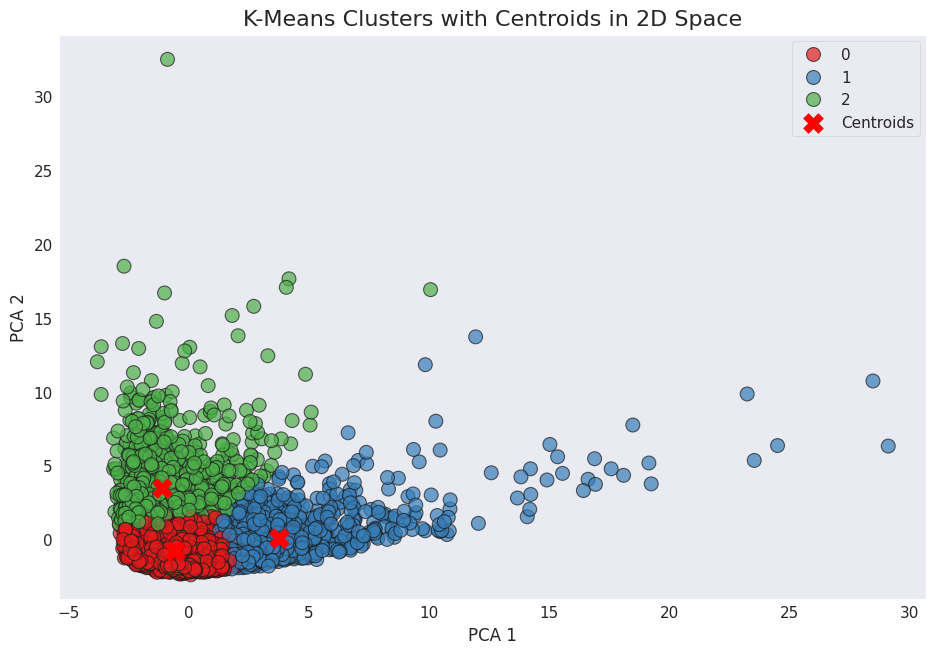

In [394]:


# Assuming df1 is your input data and kmeans_set is the additional hyperparameters for KMeans
kmeans = KMeans(n_clusters=3, **kmeans_set).fit(df1)

# Getting cluster labels and centroids
pred = kmeans.labels_
centroids = kmeans.cluster_centers_

# Reduce the data to 2D using PCA
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(df1)

# Create a DataFrame for the reduced data
df_reduced = pd.DataFrame(reduced_data, columns=['PCA1', 'PCA2'])
df_reduced['Cluster'] = pred  # Add the cluster labels

# Plotting
plt.figure(figsize=(10, 7))
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', palette='Set1', data=df_reduced, s=100, alpha=0.7, edgecolor='k')

# Plot the centroids on the graph
centroids_2d = pca.transform(centroids)  # Transform centroids into 2D space
plt.scatter(centroids_2d[:, 0], centroids_2d[:, 1], marker='X', color='red', s=200, label='Centroids')

# Labeling the plot
plt.title('K-Means Clusters with Centroids in 2D Space', fontsize=16)
plt.xlabel('PCA 1', fontsize=12)
plt.ylabel('PCA 2', fontsize=12)
plt.legend()

# Show the plot
plt.show()


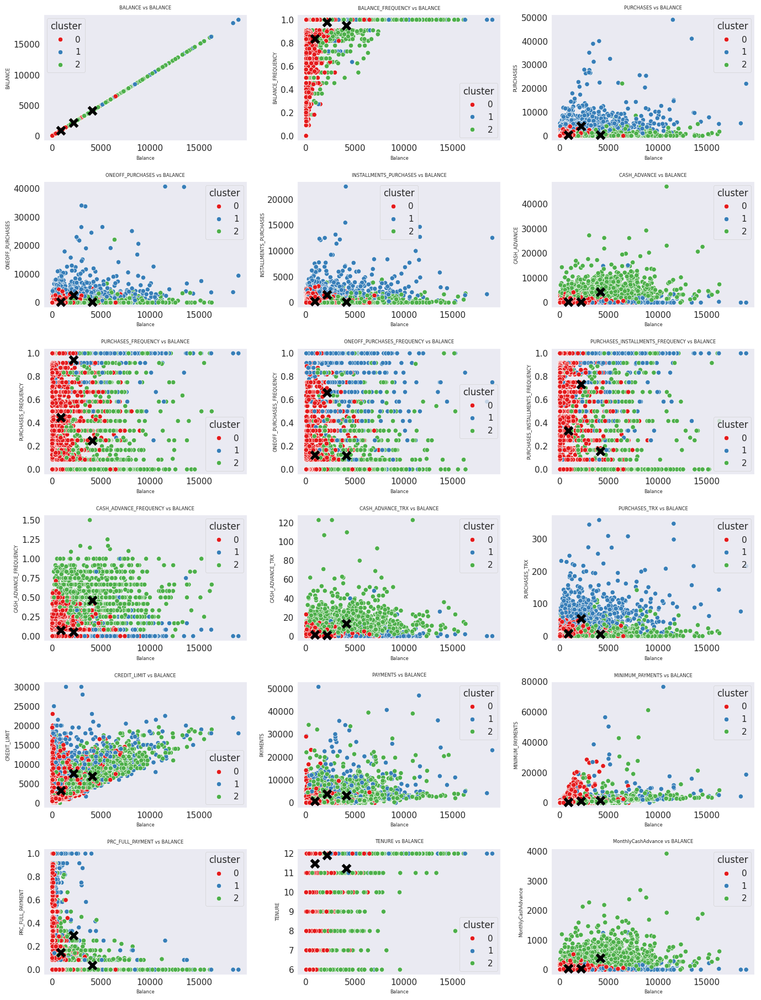

In [395]:
columns = ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
           'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
           'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
           'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
           'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
           'TENURE', 'MonthlyCashAdvance']

fig = plt.figure(figsize=(14, 24))  # Set the figure size for the entire grid

# Iterate over the features (columns) to create scatter plots
for i, col in enumerate(columns):
    ax = fig.add_subplot(8, 3, i + 1)  # 8 rows, 3 columns, and index starts from 1
    sns.scatterplot(x='BALANCE', y=col, hue='cluster', data=df_kmeans, palette=sns.color_palette("Set1", n_colors=3), ax=ax)

    # Plot KMeans cluster centers (inverse-transformed) with cross ('x') marker
    for j in range(3):  # There are 3 clusters
        ax.scatter(actualcentroids.iloc[j, 0], actualcentroids.iloc[j, df1.columns.get_loc(col)], marker='x', color='black', s=100, label=f'Cluster {j} Center')

    ax.set_title(f'{col} vs BALANCE', fontsize=6)  # Add title for each plot with smaller font size
    ax.set_xlabel('Balance', fontsize=6)  # Set smaller font size for x-axis label
    ax.set_ylabel(col, fontsize=6)  # Set smaller font size for y-axis label

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

In [396]:
silhouette_avg = silhouette_score(df1, pred)
print(f"Silhouette Score: {silhouette_avg}")

Silhouette Score: 0.27475098795724223


# DBSCAN

Text(0.5, 1.0, 'K-Distance Graph')

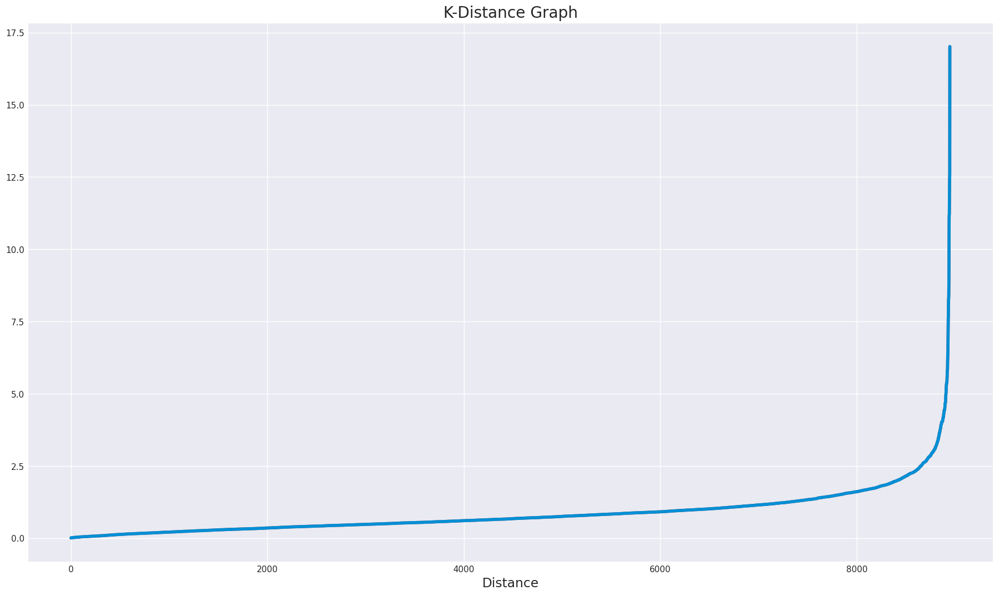

In [397]:
knn = NearestNeighbors(n_neighbors = 4)
model = knn.fit(df1)
distances, indices = knn.kneighbors(df1)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances, c='r', label='K-Distance')
plt.grid()
plt.plot(distances);
plt.xlabel('Distance')
plt.title('K-Distance Graph')

In [398]:
eps_values = np.arange(1,15,2)
min_samples = np.arange(20,41,10)
DBSCAN_params = list(product(eps_values, min_samples))

In [399]:
silhouette = []
num_of_clusters = []
for param in DBSCAN_params:
    dbscan = DBSCAN(eps=param[0], min_samples=param[1])
    dbscan.fit(df1)
    score = silhouette_score(df1, dbscan.labels_)
    silhouette.append(score)
    num_of_clusters.append(len(np.unique(dbscan.labels_)))
calinski_harabasz = []
for param in DBSCAN_params:
    dbscan = DBSCAN(eps=param[0], min_samples=param[1])
    dbscan.fit(df1)
    score = calinski_harabasz_score(df1, dbscan.labels_)
    calinski_harabasz.append(score)

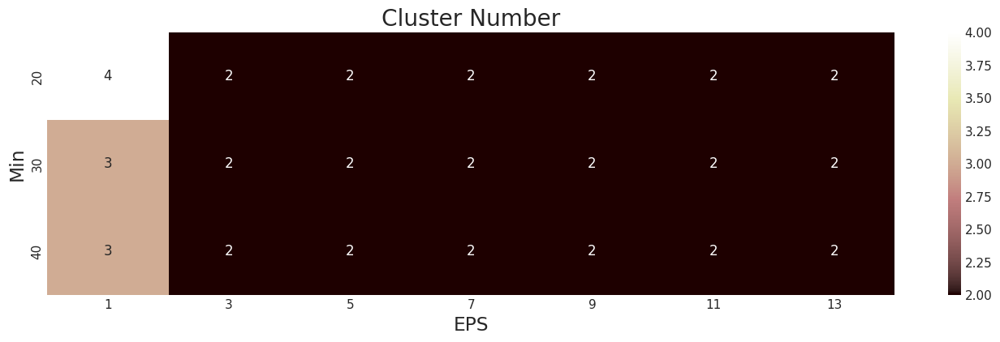

In [400]:
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['EPS', 'Min'])
tmp['ClustersNumber'] = num_of_clusters
p = pd.pivot_table(tmp, values='ClustersNumber', index='Min', columns='EPS')
fig, ax = plt.subplots(figsize=(15,4))
sns.heatmap(p, annot=True,annot_kws={"size": 12}, cmap="pink", ax=ax)
ax.set_title('Cluster Number')
plt.show()

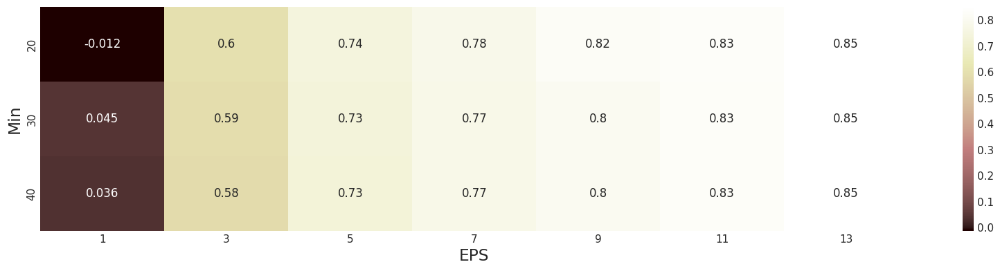

In [401]:
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['EPS', 'Min'])
tmp['sillhouettescore'] = silhouette
p2 = pd.pivot_table(tmp, values='sillhouettescore', index='Min', columns='EPS')
fig, ax = plt.subplots(figsize=(18,4))
sns.heatmap(p2, annot=True, annot_kws={"size": 12}, cmap="pink", ax=ax)
plt.show()

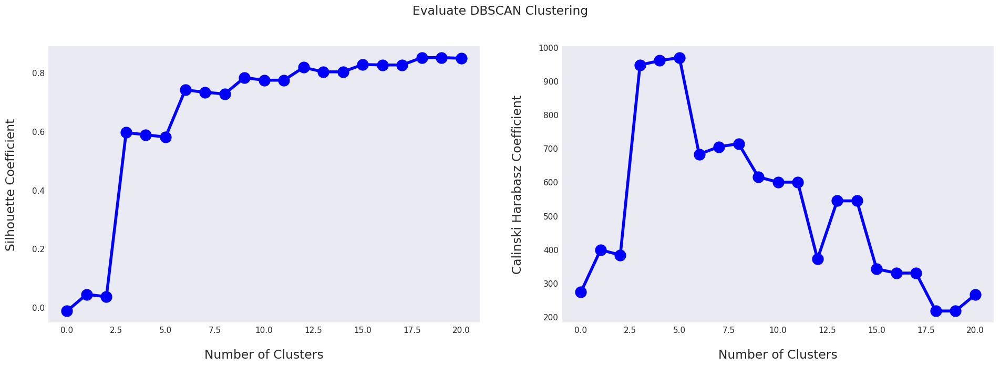

In [402]:
plot_evaluation(silhouette, calinski_harabasz, 'DBSCAN', x=range(len(DBSCAN_params)))

In [403]:
for i in enumerate(DBSCAN_params):
    print(i)

(0, (1, 20))
(1, (1, 30))
(2, (1, 40))
(3, (3, 20))
(4, (3, 30))
(5, (3, 40))
(6, (5, 20))
(7, (5, 30))
(8, (5, 40))
(9, (7, 20))
(10, (7, 30))
(11, (7, 40))
(12, (9, 20))
(13, (9, 30))
(14, (9, 40))
(15, (11, 20))
(16, (11, 30))
(17, (11, 40))
(18, (13, 20))
(19, (13, 30))
(20, (13, 40))


In [404]:
epsvals = np.arange(3,5,0.25)
min_samples = np.arange(20,41,10)
DBSCAN_params = list(product(epsvals, min_samples))

In [405]:
silhouette = []
num_of_clusters = []
for param in DBSCAN_params:
    dbscan = DBSCAN(eps=param[0], min_samples=param[1])
    dbscan.fit(df1)
    score = silhouette_score(df1, dbscan.labels_)
    silhouette.append(score)
    num_of_clusters.append(len(np.unique(dbscan.labels_)))
calinski_harabasz = []
for param in DBSCAN_params:
    dbscan = DBSCAN(eps=param[0], min_samples=param[1])
    dbscan.fit(df1)
    score = calinski_harabasz_score(df1, dbscan.labels_)
    calinski_harabasz.append(score)

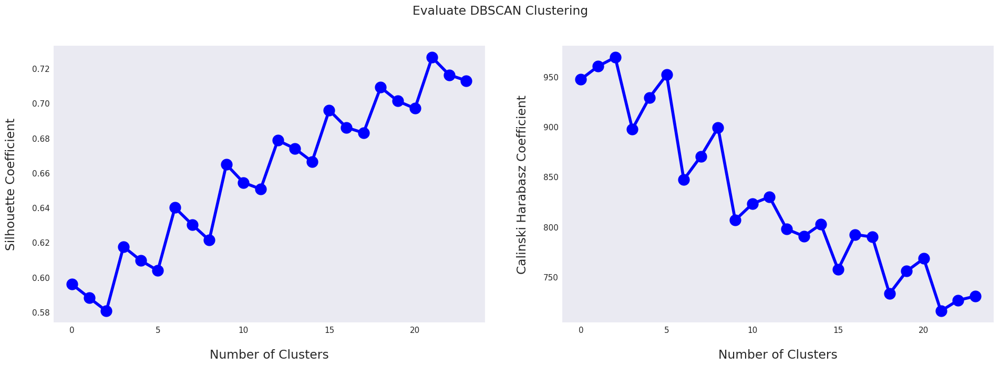

In [406]:
plot_evaluation(silhouette, calinski_harabasz, 'DBSCAN', x=range(len(DBSCAN_params)))

In [407]:
for i in enumerate(DBSCAN_params):
    print(i)

(0, (3.0, 20))
(1, (3.0, 30))
(2, (3.0, 40))
(3, (3.25, 20))
(4, (3.25, 30))
(5, (3.25, 40))
(6, (3.5, 20))
(7, (3.5, 30))
(8, (3.5, 40))
(9, (3.75, 20))
(10, (3.75, 30))
(11, (3.75, 40))
(12, (4.0, 20))
(13, (4.0, 30))
(14, (4.0, 40))
(15, (4.25, 20))
(16, (4.25, 30))
(17, (4.25, 40))
(18, (4.5, 20))
(19, (4.5, 30))
(20, (4.5, 40))
(21, (4.75, 20))
(22, (4.75, 30))
(23, (4.75, 40))


In [408]:
dbscan = DBSCAN(eps=3.5, min_samples=40)
dbscan.fit(df1)
pred = dbscan.labels_
num_of_clusters = len(np.unique(pred))
sh_score = silhouette_score(df1, pred)
ch_score = calinski_harabasz_score(df1, pred)
print(f"Number of cluster: {np.unique(pred)}")
print(f"Silhouette Coefficient: {sh_score:.2f}")
print(f"Calinski Harabasz Coefficient: {ch_score:.2f}")

Number of cluster: [-1  0]
Silhouette Coefficient: 0.62
Calinski Harabasz Coefficient: 899.06


In [409]:
best_model.loc[len(best_model.index)] = [f"DBSCAN",silhouette_score(df1, pred),calinski_harabasz_score(df1, pred)]
print("Silhouette Score: ", silhouette_score(df1, pred))
print("Calinski Harabasz Score: ", calinski_harabasz_score(df1, pred))

Silhouette Score:  0.6213157333804991
Calinski Harabasz Score:  899.0600477097845


In [410]:
df_dbscan = pd.concat([df, pd.DataFrame(pred, columns=['cluster'])], axis = 1)
df_dbscan

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,MonthlyCashAdvance,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,0.000000,0
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,536.912124,0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,0.000000,0
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,0.000000,0.000000,12,17.149001,0
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,0.000000,0
8945,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,275.861322,0.000000,6,0.000000,0
8946,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,0.000000,0
8947,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,6.093130,0


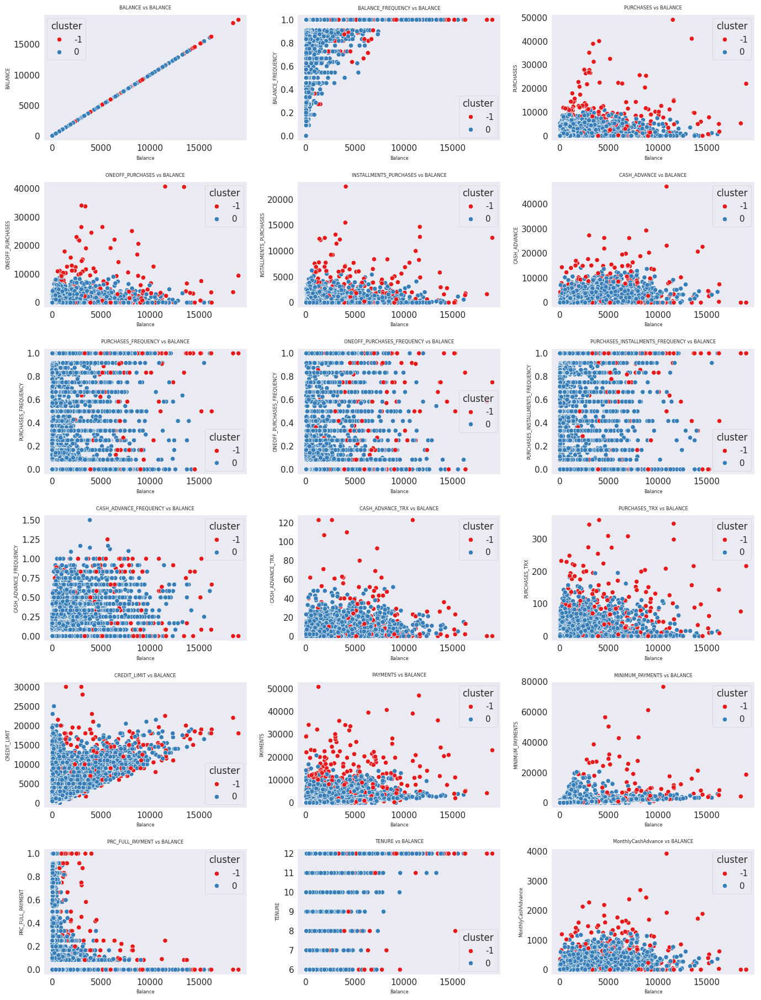

In [411]:
columns = ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
           'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
           'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
           'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
           'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
           'TENURE', 'MonthlyCashAdvance']

fig = plt.figure(figsize=(14, 24))  # Set the figure size for the entire grid

# Iterate over the features (columns) to create scatter plots
for i, col in enumerate(columns):
    ax = fig.add_subplot(8, 3, i + 1)  # 8 rows, 3 columns, and index starts from 1
    sns.scatterplot(x='BALANCE', y=col, hue='cluster', data=df_dbscan, palette=sns.color_palette("Set1", n_colors=2), ax=ax)
    ax.set_title(f'{col} vs BALANCE', fontsize=6)  # Add title for each plot with smaller font size
    ax.set_xlabel('Balance', fontsize=6)  # Set smaller font size for x-axis label
    ax.set_ylabel(col, fontsize=6)  # Set smaller font size for y-axis label

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

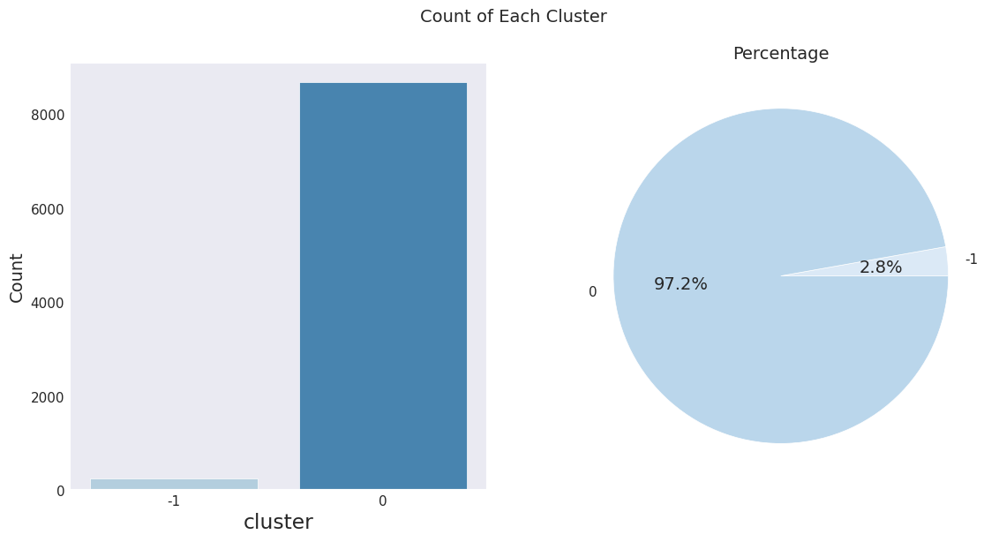

In [412]:
check_result(df_dbscan, plot=True)

# GMM

In [413]:
gm = GaussianMixture(n_components=2, random_state=42, covariance_type='full')
gm.fit(df1)
pred = gm.predict(df1)
cluster_means = gm.means_
cluster_means = pd.DataFrame(data=cluster_means, columns = [df1.columns])
cluster_means.T

,0,1
BALANCE,0.426477,-0.465632
BALANCE_FREQUENCY,0.187641,-0.204868
PURCHASES,-0.016162,0.017646
ONEOFF_PURCHASES,0.004543,-0.004961
INSTALLMENTS_PURCHASES,-0.046817,0.051116
CASH_ADVANCE,0.427509,-0.466759
PURCHASES_FREQUENCY,-0.375865,0.410374
ONEOFF_PURCHASES_FREQUENCY,-0.139938,0.152786
PURCHASES_INSTALLMENTS_FREQUENCY,-0.297601,0.324924
CASH_ADVANCE_FREQUENCY,0.618062,-0.674808


In [414]:
best_model.loc[len(best_model.index)] = [f"GMM",silhouette_score(df1, pred),calinski_harabasz_score(df1, pred)]
print("Silhouette Score:", silhouette_score(df1, pred))
print("Calinski Harabasz Score:", calinski_harabasz_score(df1, pred))

Silhouette Score: 0.11489109469329134
Calinski Harabasz Score: 964.9104920231829


In [415]:
cluster_means = scaler.inverse_transform(cluster_means)
cluster_means = pd.DataFrame(data = cluster_means, columns = [df.columns])
cluster_means

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,MonthlyCashAdvance
0,2452.345637,0.921781,968.784813,600.045032,368.775296,1875.509159,0.339557,0.160733,0.246203,0.258828,6.223653,13.229499,4756.846612,2305.445765,1344.214244,0.059575,11.433952,170.478737
1,595.448596,0.828840,1041.019508,584.269720,457.339006,0.096450,0.655104,0.248061,0.493612,0.000097,0.001402,16.329516,4207.961193,1108.701007,286.326530,0.256533,11.609628,0.008038


In [416]:
df_gm = pd.concat([df, pd.DataFrame(pred, columns=['cluster'])], axis = 1)
df_gm

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,MonthlyCashAdvance,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,0.000000,1
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,536.912124,0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,0.000000,1
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,0.000000,0.000000,12,17.149001,0
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,0.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,0.000000,1
8945,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,275.861322,0.000000,6,0.000000,1
8946,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,0.000000,1
8947,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,6.093130,0


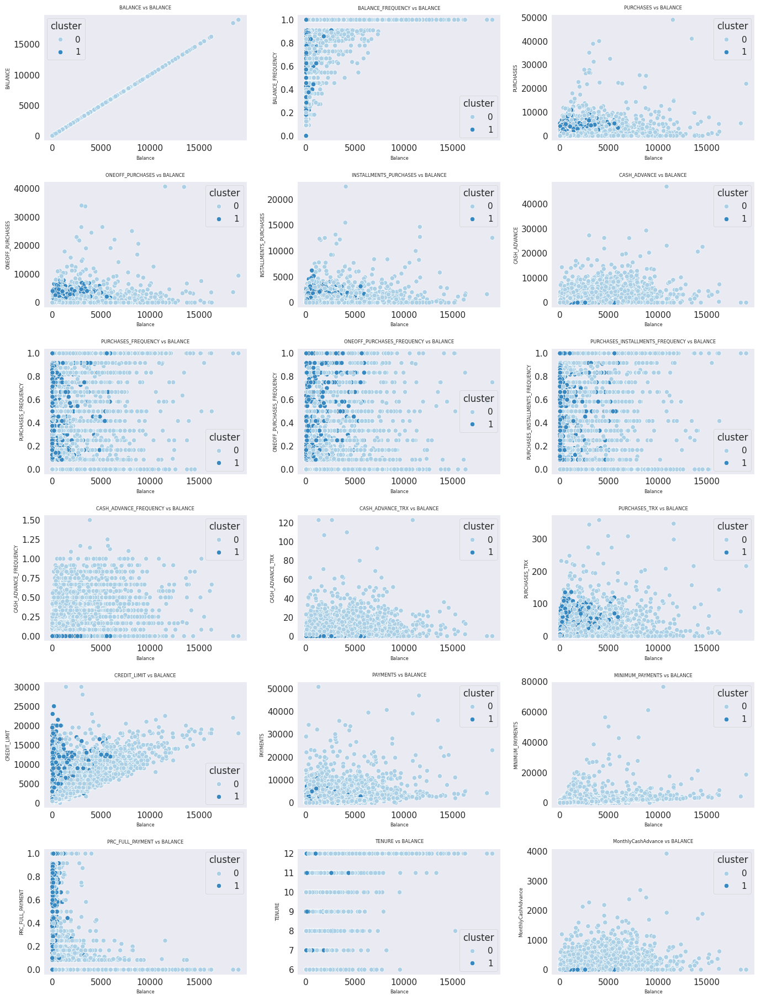

In [417]:
columns= ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE', 'MonthlyCashAdvance']
fig = plt.figure(figsize=(14, 24))  # Set the figure size for the entire grid

# Iterate over the features (columns) to create scatter plots
for i, col in enumerate(columns):
    ax = fig.add_subplot(8, 3, i + 1)  # 8 rows, 3 columns, and index starts from 1
    sns.scatterplot(x='BALANCE', y=col, hue='cluster', data=df_gm, palette="Blues", ax=ax)
    ax.set_title(f'{col} vs BALANCE', fontsize=6)  # Add title for each plot with smaller font size
    ax.set_xlabel('Balance', fontsize=6)  # Set smaller font size for x-axis label
    ax.set_ylabel(col, fontsize=6)  # Set smaller font size for y-axis label

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

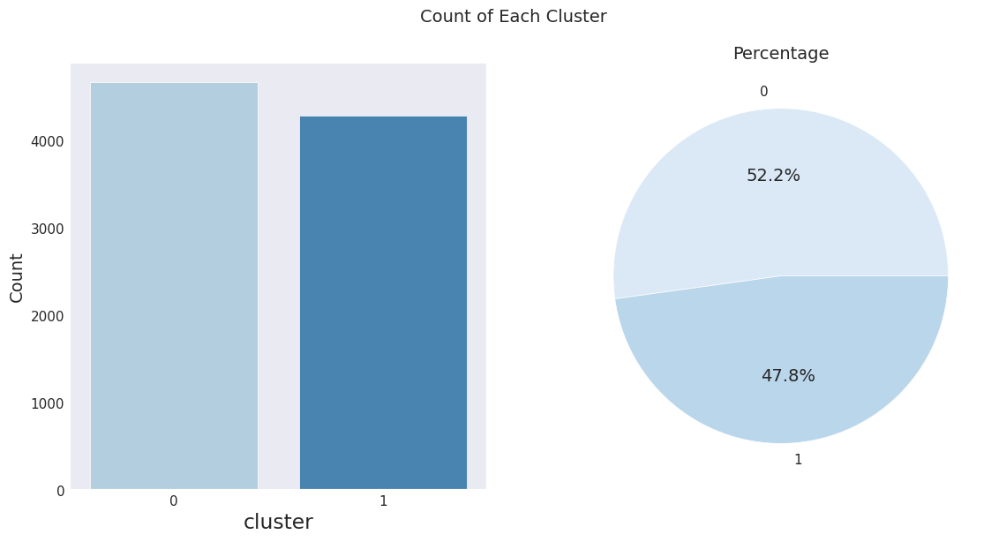

In [418]:
check_result(df_gm, plot=True)

# Hybrid Clustering

AFTER APPLYING PCA

In [419]:
kmeans_labels = df_kmeans['cluster']
dbscan_labels = df_dbscan['cluster']
gmm_labels = df_gm['cluster']

In [420]:
# Calculate distances from each point to its cluster centroid for K-Means and GMM
distance_to_kmeans_centroid = np.linalg.norm(df1 - kmeans.cluster_centers_[kmeans_labels], axis=1)
distance_to_gmm_centroid = np.linalg.norm(df1 - gm.means_[gmm_labels], axis=1)
dbscan_centroids = df1.groupby(dbscan_labels).mean()
distance_to_dbscan_centroid = [
    np.linalg.norm(df1.iloc[i] - dbscan_centroids.loc[label]) if label != -1 else 10000
    for i, label in enumerate(dbscan_labels)
]

# Step 2: Create new features based on clustering results
df_hybrid_features = pd.DataFrame({
    'kmeans_label': kmeans_labels,
    'dbscan_label': dbscan_labels,
    'gmm_label': gmm_labels,
    'distance_to_kmeans_centroid': distance_to_kmeans_centroid,
    'distance_to_gmm_centroid': distance_to_gmm_centroid,
    'distance_to_dbscan_centroid': distance_to_dbscan_centroid,
    'dbscan_noise': (dbscan_labels == -1).astype(int)  # 1 if noise, 0 otherwise
})

# Step 3: Apply a secondary clustering algorithm on the new feature set
kmeans_final = KMeans(n_clusters=3, random_state=42)
final_labels = kmeans_final.fit_predict(df_hybrid_features)

# Step 4: Evaluate the hybrid clustering
sil_score = silhouette_score(df_hybrid_features, final_labels)
print(f"Silhouette Score for Feature-Level Hybrid Clustering: {sil_score:.2f}")

Silhouette Score for Feature-Level Hybrid Clustering: 0.99


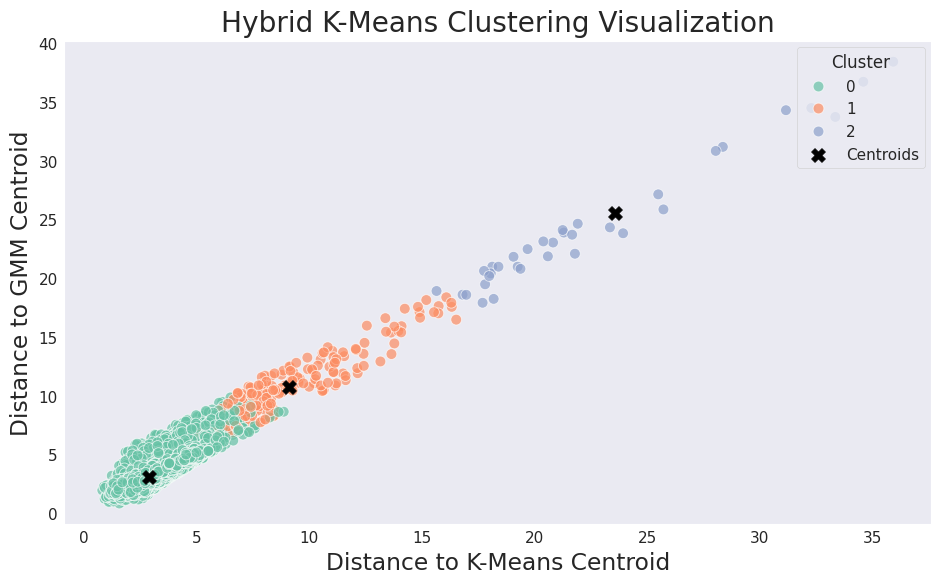

In [421]:
# Add the final K-means cluster labels to the feature dataframe for visualization
df_hybrid_features['final_cluster'] = final_labels

# Visualize the clusters based on two most distinguishing features from df_hybrid_features
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='distance_to_kmeans_centroid',
    y='distance_to_gmm_centroid',
    hue='final_cluster',
    data=df_hybrid_features,
    palette='Set2',
    s=60,
    alpha=0.7
)
plt.scatter(
    kmeans_final.cluster_centers_[:, df_hybrid_features.columns.get_loc('distance_to_kmeans_centroid')],
    kmeans_final.cluster_centers_[:, df_hybrid_features.columns.get_loc('distance_to_gmm_centroid')],
    color='black',
    s=100,
    label='Centroids',
    marker='X'
)

plt.title("Hybrid K-Means Clustering Visualization")
plt.xlabel("Distance to K-Means Centroid")
plt.ylabel("Distance to GMM Centroid")
plt.legend(title="Cluster", loc="upper right")
plt.show()


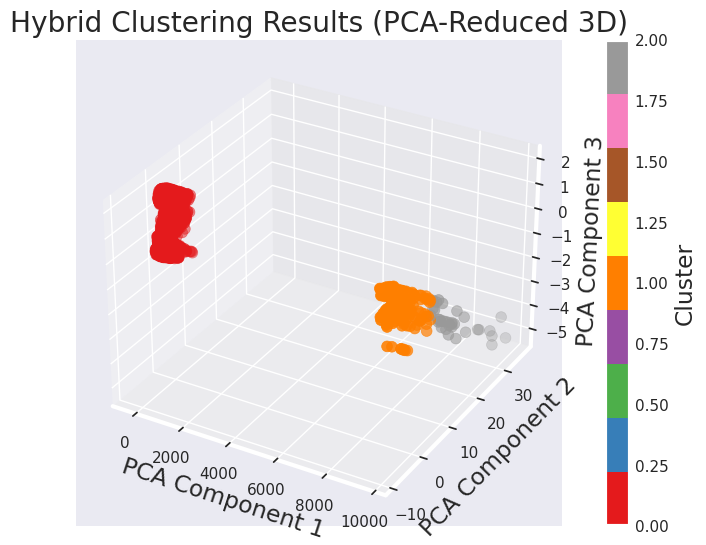

In [422]:
# Step 1: Apply PCA to reduce to 3 dimensions for visualization
pca = PCA(n_components=3)
df_hybrid_pca = pca.fit_transform(df_hybrid_features)  # Reduce features to 3D

# Create a DataFrame for the PCA results
df_hybrid_pca = pd.DataFrame(df_hybrid_pca, columns=['PCA1', 'PCA2', 'PCA3'])
df_hybrid_pca['final_label'] = final_labels

# Step 2: Plot the clusters in the PCA-reduced 3D space
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')

# Plot each cluster in the 3D space
scatter = ax.scatter(
    df_hybrid_pca['PCA1'], df_hybrid_pca['PCA2'], df_hybrid_pca['PCA3'],
    c=df_hybrid_pca['final_label'], cmap='Set1', s=60
)

# Customize plot appearance
ax.set_title('Hybrid Clustering Results (PCA-Reduced 3D)')
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
plt.colorbar(scatter, ax=ax, label='Cluster')

plt.show()


In [423]:
silhouette_scores = []
for seed in [42,52,55,65,75,85,92]:
    kmeans_temp = KMeans(n_clusters=3, random_state=seed)
    temp_labels = kmeans_temp.fit_predict(df_hybrid_features)
    sil_score_temp = silhouette_score(df_hybrid_features, temp_labels)
    silhouette_scores.append(sil_score_temp)
    print(f"Silhouette Score with seed {seed}: {sil_score_temp:.2f}")

print("Average Silhouette Score:", np.mean(silhouette_scores))
print("Standard Deviation of Silhouette Scores:", np.std(silhouette_scores))


Silhouette Score with seed 42: 0.99
Silhouette Score with seed 52: 0.50
Silhouette Score with seed 55: 0.49
Silhouette Score with seed 65: 0.54
Silhouette Score with seed 75: 0.46
Silhouette Score with seed 85: 0.51
Silhouette Score with seed 92: 0.53
Average Silhouette Score: 0.5752187517433079
Standard Deviation of Silhouette Scores: 0.17197705108268693


In [424]:
rf = RandomForestClassifier(random_state=42)
rf.fit(df_hybrid_features, final_labels)
feature_importances = pd.Series(rf.feature_importances_, index=df_hybrid_features.columns)
feature_importances = feature_importances.sort_values(ascending=False)
print("Feature Importances:\n", feature_importances)


Feature Importances:
 dbscan_label                   0.235000
distance_to_dbscan_centroid    0.226678
final_cluster                  0.205830
dbscan_noise                   0.138266
distance_to_kmeans_centroid    0.117743
distance_to_gmm_centroid       0.073139
kmeans_label                   0.003310
gmm_label                      0.000033
dtype: float64


In [425]:
df1['final_cluster'] = final_labels  # assuming final_labels are the labels from your hybrid clustering


In [426]:
cluster_profiles = df1.groupby('final_cluster').mean()

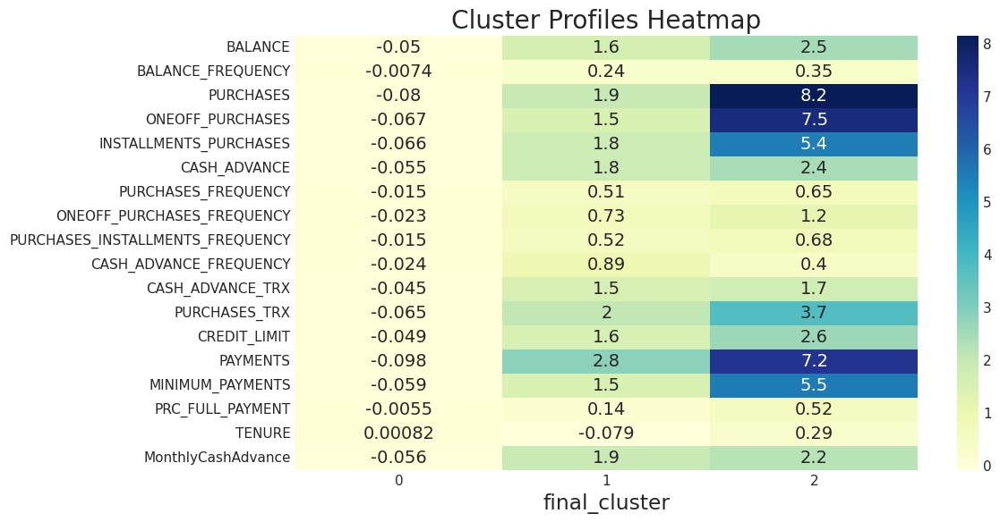

In [427]:
plt.figure(figsize=(10, 6))
sns.heatmap(cluster_profiles.T, annot=True, cmap="YlGnBu", cbar=True)
plt.title("Cluster Profiles Heatmap")
plt.show()
